# A Novel Kernel-Based Approach For Uneven length Symbolic Data: A Case Study for Establishing Type 2 Diabetes Risk

## Peptide Validation data set
### LOOCV on SVM 

Script used to run Suport Vector machine (SVM) classifier on Bag-of-Words (Binary) feature representation of the Peptide validation dataset.

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.svm import SVC
from util_log import *
from util_ker import *

In [2]:
#Load data
df_BoW = pd.read_csv(R'C:\Users\NN133\Documents\GitHub\AntiCancer_Peptides\Bow_peptide.csv', header=None)
df_BIN = pd.read_csv(R'C:\Users\NN133\Documents\GitHub\AntiCancer_Peptides\Bin_peptide.csv', header=None)

In [3]:
labelloc = R'C:\Users\NN133\Documents\GitHub\AntiCancer_Peptides\ytr.csv'
label = pd.read_csv(labelloc, header=None)

In [4]:
#Extract the labels
ytr = label.values
ytr.shape

(388, 1)

In [5]:
#Extract the Data
BOW = df_BoW.values
BIN = df_BIN.values

print(f'--> Size of BoW features --- {BOW.shape}')
print(f'--> Size of BIN features --- {BIN.shape}')

--> Size of BoW features --- (388, 22)
--> Size of BIN features --- (388, 22)


## Set kernel parameters

In [6]:
#Set kernel parameters
params = {}
params['linear']  = [1]
params['H_poly']  = [0.5,2,3,4]
params['poly']    = [0.5,2,3,4]
params['rbf']     = [0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.1,7.5,12.5,125,1250]
params['erbf']    = [0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.1,7.5,12.5,125,1250]
params['laplace'] = [0.000000125,0.00000125,0.00001,0.001,0.0023,0.005,0.007,0.00987,0.1,7.5,12.5,125,1250]

## Linear Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.920 (0.271)
--> The total of 388 predicted with only 357 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  177
Actual label is False while we predicted False -  True Negatve   =  180
Actual label is False while we predicted True  -  False Positive =  18
Actual label is True while we predicted False  -  False Negative =  13


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.01 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.91 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.09 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.92 achieved


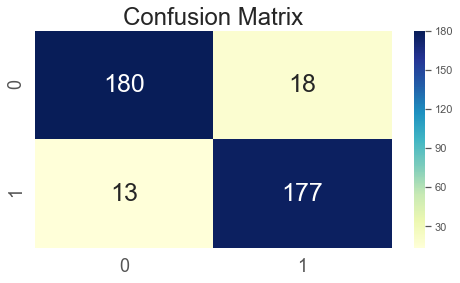

In [7]:
#Fit Cross validation model 
kernel = ['linear']
OUT_linear = fitkernelLOOCV(BOW, ytr, kernel, params)

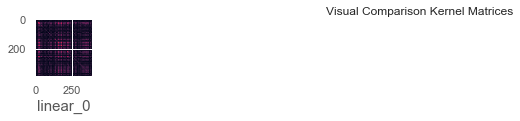

In [8]:
#Analyse performance results
PerfEva_linear, KerAna_linear, CVPerf_linear, CVvalus_linear  = Analyse_ResultsLOOCV(OUT_linear)

In [9]:
#Extract performance evaluation
PerfEva_linear

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_0,195,193,92.01,0.93,0.91,0.5,0.5,0.07,0.09,0.93,0.93,0.91,0.92


In [10]:
PerfEva_linear[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_0,0.92,92.01,0.93,0.91


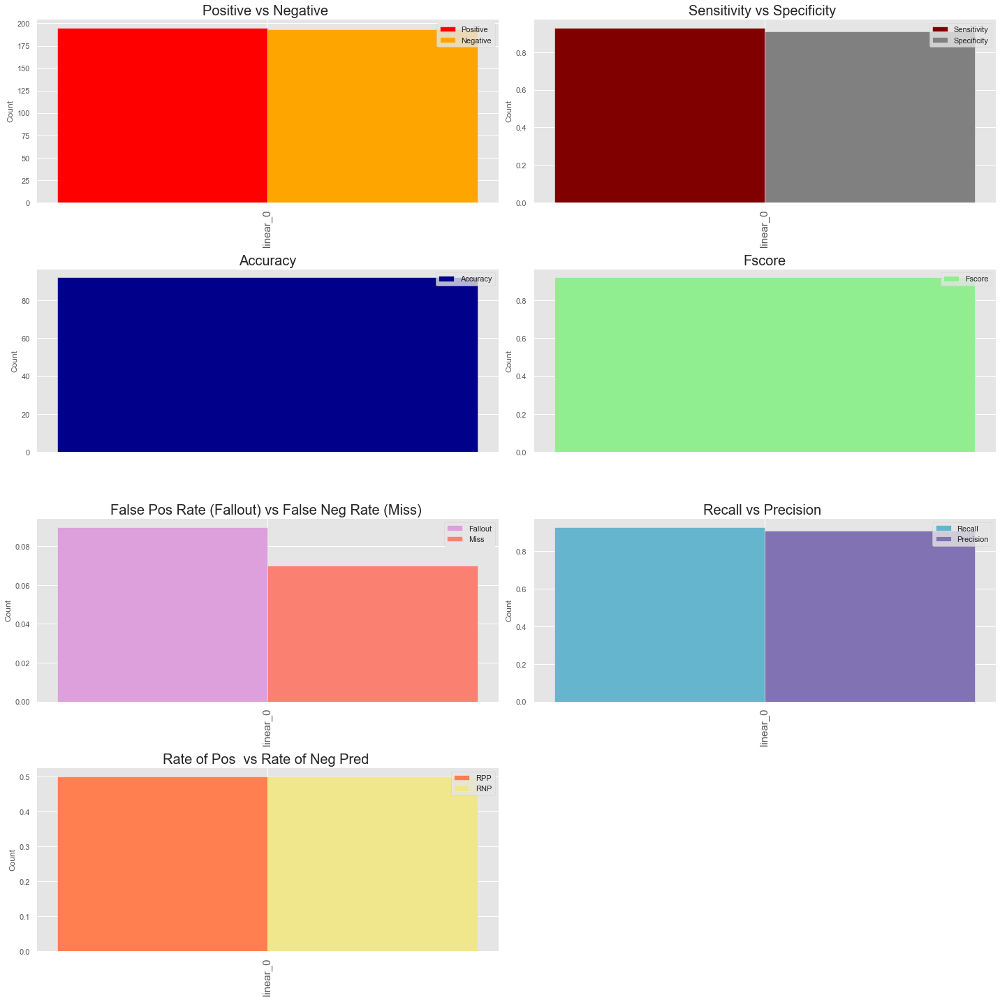

In [11]:
#visualize results
plotResult(PerfEva_linear)

In [12]:
#Extract best performing parameter
id_linear = PerfEva_linear.reset_index().Fscore.argmax()
max_Params_linear = params[kernel[0]][id_linear]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_linear.Fscore[id_linear]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_linear.Accu[id_linear]}')

Best Fscore obtained with linear kernel   - > 0.92
Best Accuracy obtained with linear kernel - > 92.01


In [13]:
#Best result showing the specific kernel
BestRes_linear = pd.DataFrame(PerfEva_linear.iloc[id_linear,:]).T
#index with ref to specific kernel removed. 
BestRes_linear = BestRes_linear.reset_index().drop(['index'], axis =1)
BestRes_linear

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,92.01,0.93,0.91,0.5,0.5,0.07,0.09,0.93,0.93,0.91,0.92


In [14]:
BestRes_linear[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,92.01,0.93,0.91


In [15]:
#Perf mean score and std
CVPerf_linear.round(4)

,mean score,std
linear_0,0.9201,0.2711


In [16]:
#Extract best score mean/std
Bestscore_linear = pd.DataFrame(CVPerf_linear.iloc[id_linear,:]).T.round(2)
Bestscore_linear = Bestscore_linear.reset_index().drop(['index'], axis =1)
Bestscore_linear

,mean score,std
0,0.92,0.27


In [17]:
#Kernel performance
KerAna_linear

,train_kernel_time,diag_Dominance,is_PSD
linear_0,0.00200415,False,True


In [18]:
#Extract best score mean/std
BestAnalysis_linear = pd.DataFrame(KerAna_linear.iloc[id_linear,:]).T
BestAnalysis_linear = BestAnalysis_linear.reset_index().drop(['index'], axis =1)
BestAnalysis_linear

,train_kernel_time,diag_Dominance,is_PSD
0,0.00200415,False,True


## Poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  173
Actual label is False while we predicted False -  True Negatve   =  179
Actual label is False while we predicted True  -  False Positive =  22
Actual label is True while we predicted False  -  False Negative =  14


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.89 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.11 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.89 achieved
--> An Fscore of 0.91 achieved


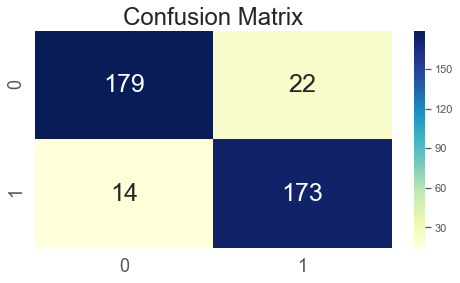

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.925 (0.263)
--> The total of 388 predicted with only 359 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  179
Actual label is False while we predicted False -  True Negatve   =  180
Actual label is False while we predicted True  -  False Positive =  16
Actual label is True while we predicted False  -  False Negative =  13


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.53 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.92 achieved
--> An Fscore of 0.92 achieved


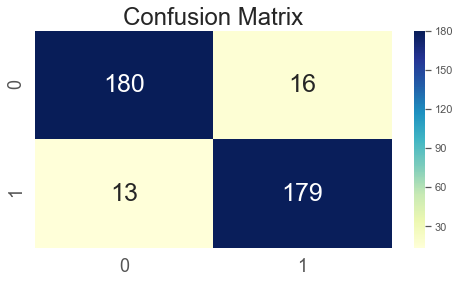

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.936 (0.246)
--> The total of 388 predicted with only 363 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  184
Actual label is False while we predicted False -  True Negatve   =  179
Actual label is False while we predicted True  -  False Positive =  11
Actual label is True while we predicted False  -  False Negative =  14


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.56 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.94 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.06 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.94 achieved
--> An Fscore of 0.93 achieved


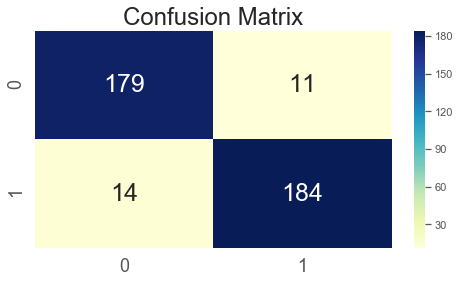

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.923 (0.267)
--> The total of 388 predicted with only 358 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  179
Actual label is False while we predicted False -  True Negatve   =  179
Actual label is False while we predicted True  -  False Positive =  16
Actual label is True while we predicted False  -  False Negative =  14


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.27 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.92 achieved
--> An Fscore of 0.92 achieved


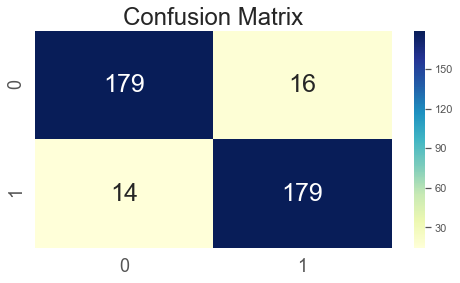

In [19]:
#Fit Cross validation model 
kernel = ['poly']
OUT_poly = fitkernelLOOCV(BOW, ytr, kernel, params)

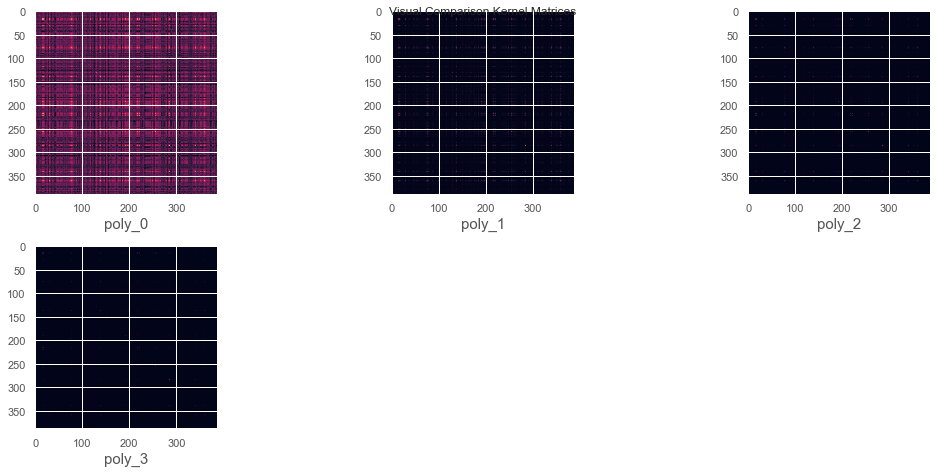

In [20]:
#Analyse performance results
PerfEva_poly, KerAna_poly, CVPerf_poly, CVvalus_poly  = Analyse_ResultsLOOCV(OUT_poly)

In [21]:
#Extract performance evaluation
PerfEva_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
poly_0,195,193,90.72,0.93,0.89,0.5,0.5,0.07,0.11,0.93,0.93,0.89,0.91
poly_1,195,193,92.53,0.93,0.92,0.5,0.5,0.07,0.08,0.93,0.93,0.92,0.92
poly_2,195,193,93.56,0.93,0.94,0.5,0.5,0.07,0.06,0.93,0.93,0.94,0.93
poly_3,195,193,92.27,0.93,0.92,0.5,0.5,0.07,0.08,0.93,0.93,0.92,0.92


In [22]:
PerfEva_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
poly_0,0.91,90.72,0.93,0.89
poly_1,0.92,92.53,0.93,0.92
poly_2,0.93,93.56,0.93,0.94
poly_3,0.92,92.27,0.93,0.92


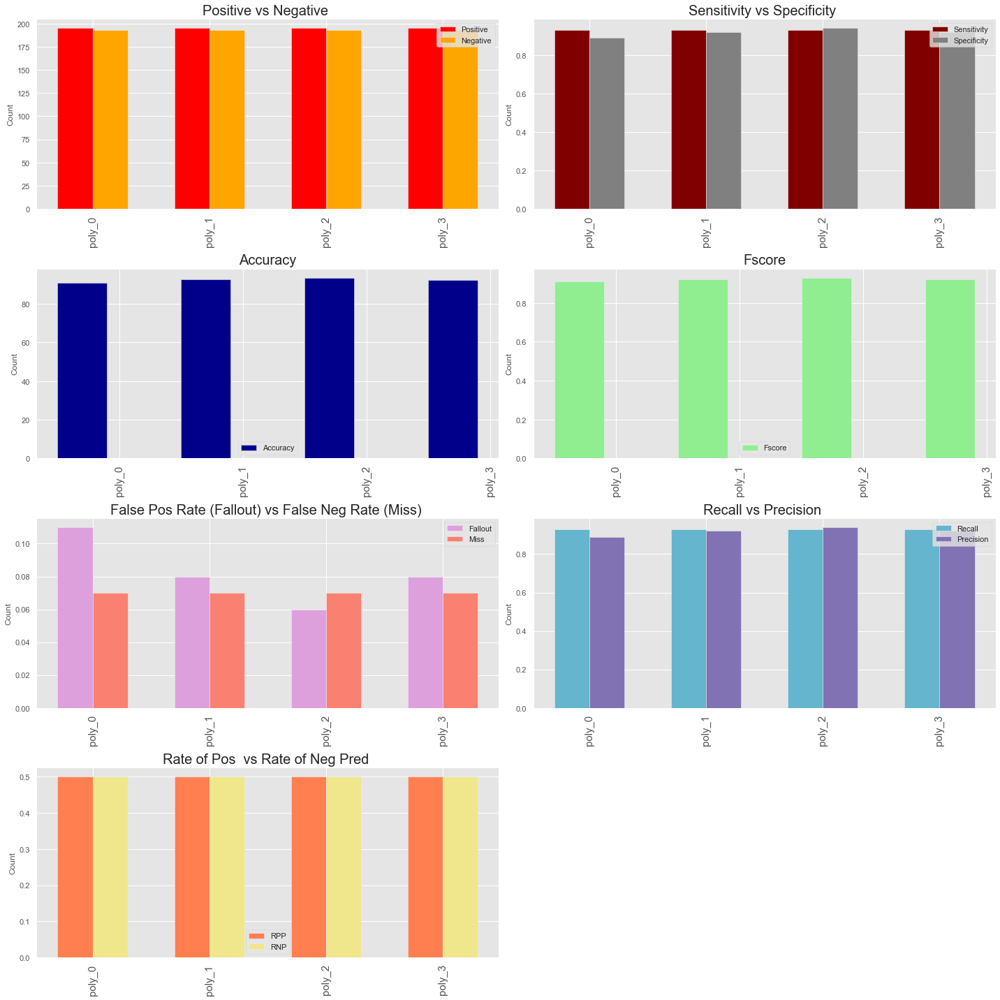

In [23]:
#visualize results
plotResult(PerfEva_poly)

In [24]:
#Extract best performing parameter
id_poly = PerfEva_poly.reset_index().Fscore.argmax()
max_Params_poly = params[kernel[0]][id_poly]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_poly.Fscore[id_poly]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_poly.Accu[id_poly]}')

Best Fscore obtained with poly kernel   - > 0.93
Best Accuracy obtained with poly kernel - > 93.56


In [25]:
#Best result showing the specific kernel
BestRes_poly = pd.DataFrame(PerfEva_poly.iloc[id_poly,:]).T
#index with ref to specific kernel removed. 
BestRes_poly = BestRes_poly.reset_index().drop(['index'], axis =1)
BestRes_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,93.56,0.93,0.94,0.5,0.5,0.07,0.06,0.93,0.93,0.94,0.93


In [26]:
BestRes_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.93,93.56,0.93,0.94


In [27]:
#Perf mean score and std
CVPerf_poly.round(2)

,mean score,std
poly_0,0.91,0.29
poly_1,0.93,0.26
poly_2,0.94,0.25
poly_3,0.92,0.27


In [28]:
#Extract best score mean/std
Bestscore_poly = pd.DataFrame(CVPerf_poly.iloc[id_poly,:]).T.round(2)
Bestscore_poly = Bestscore_poly.reset_index().drop(['index'], axis =1)
Bestscore_poly

,mean score,std
0,0.94,0.25


In [29]:
#Kernel performance
KerAna_poly

,train_kernel_time,diag_Dominance,is_PSD
poly_0,0.0050199,False,True
poly_1,0.00401068,False,True
poly_2,0.015043,False,True
poly_3,0.0150397,False,True


In [30]:
#Extract best score mean/std
BestAnalysis_poly = pd.DataFrame(KerAna_poly.iloc[id_poly,:]).T
BestAnalysis_poly = BestAnalysis_poly.reset_index().drop(['index'], axis =1)
BestAnalysis_poly

,train_kernel_time,diag_Dominance,is_PSD
0,0.015043,False,True


## H_Poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.894 (0.307)
--> The total of 388 predicted with only 347 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  172
Actual label is False while we predicted False -  True Negatve   =  175
Actual label is False while we predicted True  -  False Positive =  23
Actual label is True while we predicted False  -  False Negative =  18


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 89.43 % was achieved
--> Sensitity of 0.91 was achieved
--> Specificity of 0.88 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.09 false negative rate was achieved
--> 0.12 false positve rate (fallout) was achieved
--> Negative predictive value of 0.91
--> Recall value 0f 0.91 achieved
--> The precision vaue of 0.88 achieved
--> An Fscore of 0.89 achieved


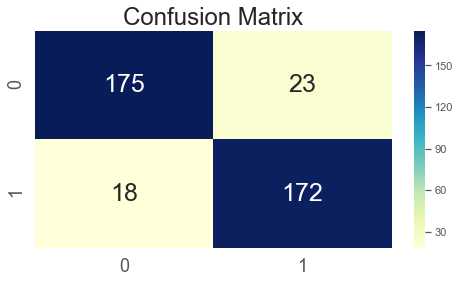

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.902 (0.297)
--> The total of 388 predicted with only 350 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  175
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  18


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.21 % was achieved
--> Sensitity of 0.91 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.09 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.91
--> Recall value 0f 0.91 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.9 achieved


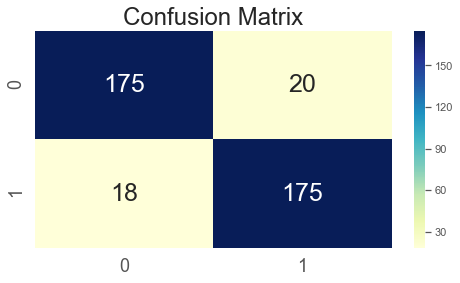

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.928 (0.259)
--> The total of 388 predicted with only 360 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  181
Actual label is False while we predicted False -  True Negatve   =  179
Actual label is False while we predicted True  -  False Positive =  14
Actual label is True while we predicted False  -  False Negative =  14


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.78 % was achieved
--> Sensitity of 0.93 was achieved
--> Specificity of 0.93 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.07 false negative rate was achieved
--> 0.07 false positve rate (fallout) was achieved
--> Negative predictive value of 0.93
--> Recall value 0f 0.93 achieved
--> The precision vaue of 0.93 achieved
--> An Fscore of 0.93 achieved


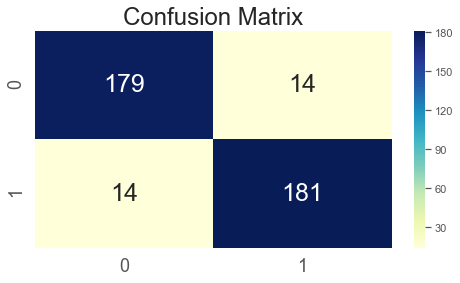

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.918 (0.275)
--> The total of 388 predicted with only 356 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  178
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  15


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 91.75 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.91 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.09 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.91 achieved


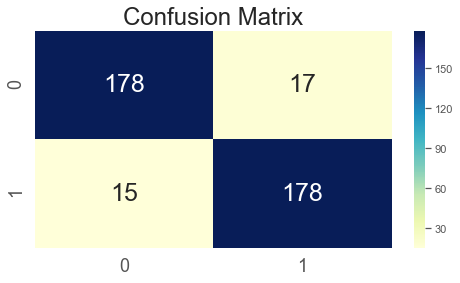

In [31]:
#Fit Cross validation model 
kernel = ['H_poly']
OUT_H_poly = fitkernelLOOCV(BOW, ytr, kernel, params)

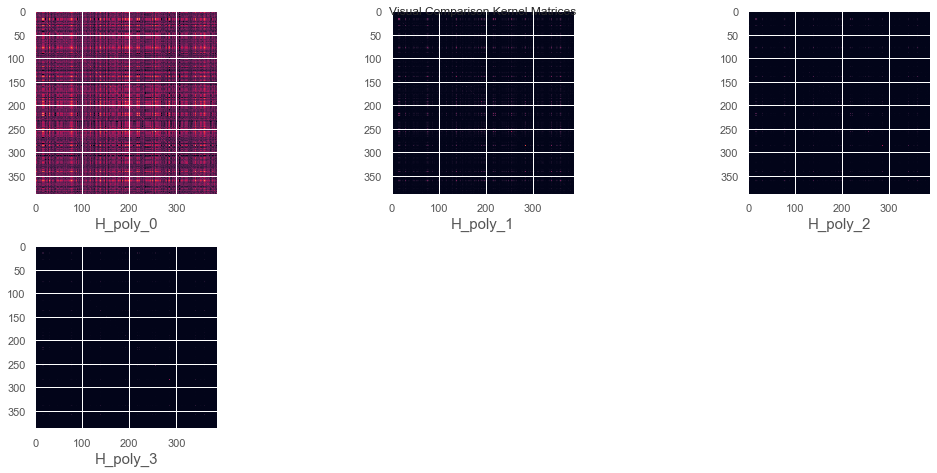

In [32]:
#Analyse performance results
PerfEva_H_poly, KerAna_H_poly, CVPerf_H_poly, CVvalus_H_poly  = Analyse_ResultsLOOCV(OUT_H_poly)

In [33]:
#Extract performance evaluation
PerfEva_H_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
H_poly_0,195,193,89.43,0.91,0.88,0.5,0.5,0.09,0.12,0.91,0.91,0.88,0.89
H_poly_1,195,193,90.21,0.91,0.90,0.5,0.5,0.09,0.10,0.91,0.91,0.90,0.90
H_poly_2,195,193,92.78,0.93,0.93,0.5,0.5,0.07,0.07,0.93,0.93,0.93,0.93
H_poly_3,195,193,91.75,0.92,0.91,0.5,0.5,0.08,0.09,0.92,0.92,0.91,0.91


In [34]:
PerfEva_H_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
H_poly_0,0.89,89.43,0.91,0.88
H_poly_1,0.90,90.21,0.91,0.90
H_poly_2,0.93,92.78,0.93,0.93
H_poly_3,0.91,91.75,0.92,0.91


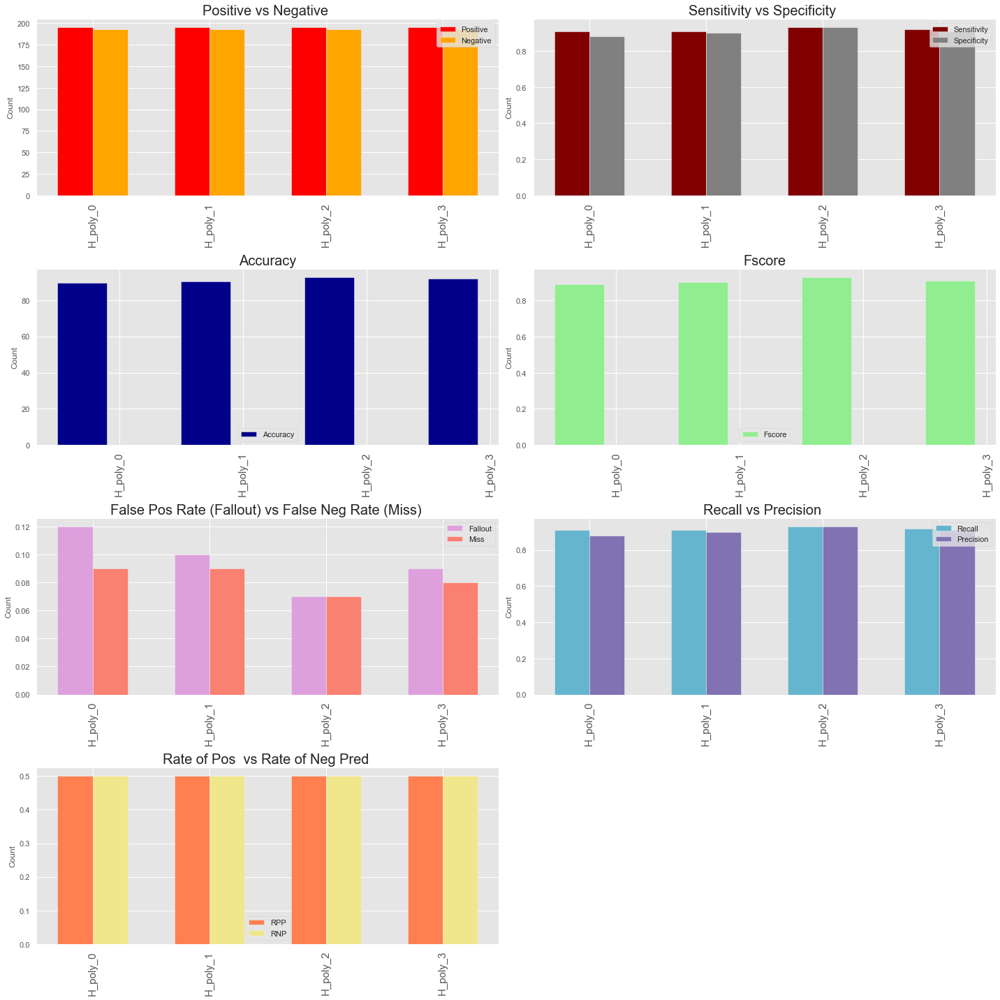

In [35]:
#visualize results
plotResult(PerfEva_H_poly)

In [36]:
#Extract best performing parameter
id_H_poly = PerfEva_H_poly.reset_index().Fscore.argmax()
max_Params_H_poly = params[kernel[0]][id_H_poly]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_H_poly.Fscore[id_H_poly]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_H_poly.Accu[id_H_poly]}')

Best Fscore obtained with H_poly kernel   - > 0.93
Best Accuracy obtained with H_poly kernel - > 92.78


In [37]:
#Best result showing the specific kernel
BestRes_H_poly = pd.DataFrame(PerfEva_H_poly.iloc[id_H_poly,:]).T
#index with ref to specific kernel removed. 
BestRes_H_poly = BestRes_H_poly.reset_index().drop(['index'], axis =1)
BestRes_H_poly

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,92.78,0.93,0.93,0.5,0.5,0.07,0.07,0.93,0.93,0.93,0.93


In [38]:
BestRes_H_poly[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.93,92.78,0.93,0.93


In [39]:
#Perf mean score and std
CVPerf_H_poly.round(2)

,mean score,std
H_poly_0,0.89,0.31
H_poly_1,0.90,0.30
H_poly_2,0.93,0.26
H_poly_3,0.92,0.28


In [40]:
#Extract best score mean/std
Bestscore_H_poly = pd.DataFrame(CVPerf_H_poly.iloc[id_H_poly,:]).T.round(2)
Bestscore_H_poly = Bestscore_H_poly.reset_index().drop(['index'], axis =1)
Bestscore_H_poly

,mean score,std
0,0.93,0.26


In [41]:
#Kernel performance
KerAna_H_poly

,train_kernel_time,diag_Dominance,is_PSD
H_poly_0,0.00300622,False,True
H_poly_1,0.00301123,False,True
H_poly_2,0.014873,False,True
H_poly_3,0.0140367,False,True


In [42]:
#Extract best score mean/std
BestAnalysis_H_poly = pd.DataFrame(KerAna_H_poly.iloc[id_H_poly,:]).T
BestAnalysis_H_poly = BestAnalysis_H_poly.reset_index().drop(['index'], axis =1)
BestAnalysis_H_poly

,train_kernel_time,diag_Dominance,is_PSD
0,0.014873,False,True


## RBF Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

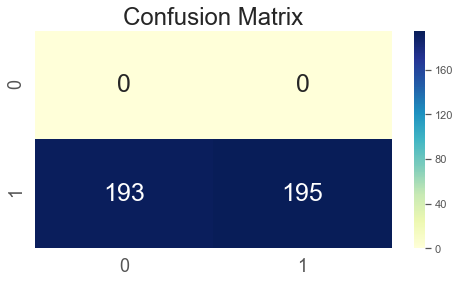

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

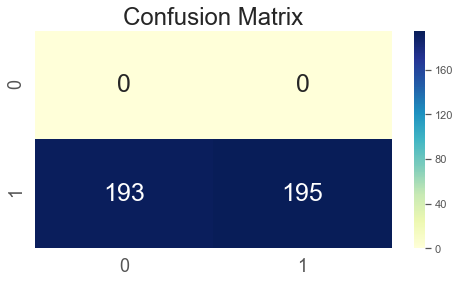

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

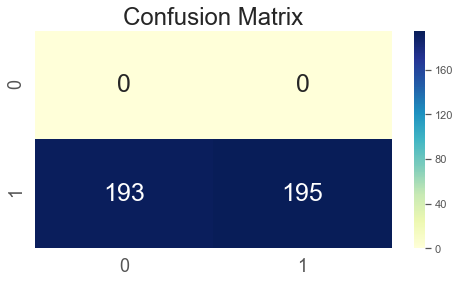

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

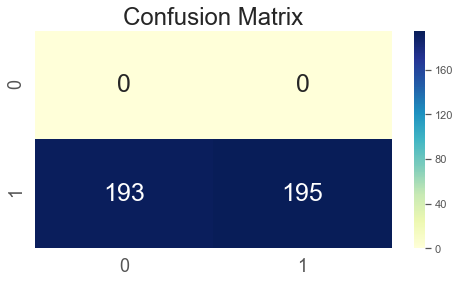

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

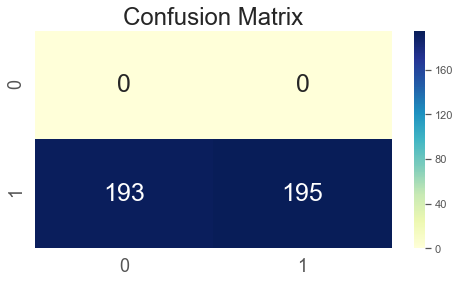

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

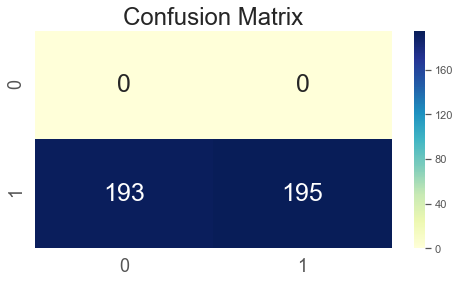

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

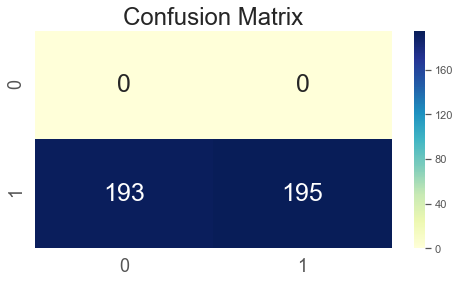

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.544 (0.498)
--> The total of 388 predicted with only 211 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  16
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  177


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 54.38 % was achieved
--> Sensitity of 0.52 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.48 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.08
--> Recall value 0f 0.52 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.68 achieved


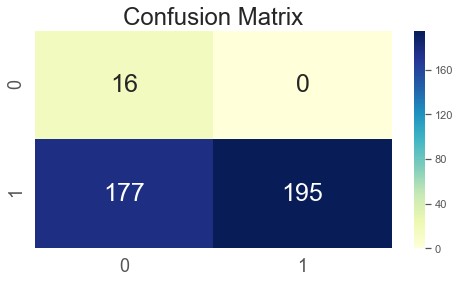

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.923 (0.267)
--> The total of 388 predicted with only 358 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  188
Actual label is False while we predicted False -  True Negatve   =  170
Actual label is False while we predicted True  -  False Positive =  7
Actual label is True while we predicted False  -  False Negative =  23


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.27 % was achieved
--> Sensitity of 0.89 was achieved
--> Specificity of 0.96 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.11 false negative rate was achieved
--> 0.04 false positve rate (fallout) was achieved
--> Negative predictive value of 0.88
--> Recall value 0f 0.89 achieved
--> The precision vaue of 0.96 achieved
--> An Fscore of 0.92 achieved


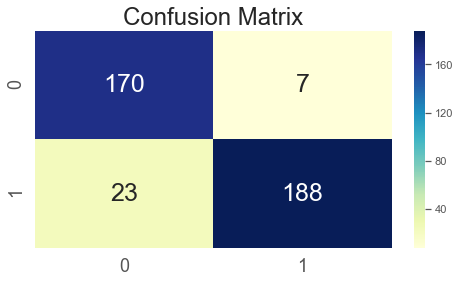

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

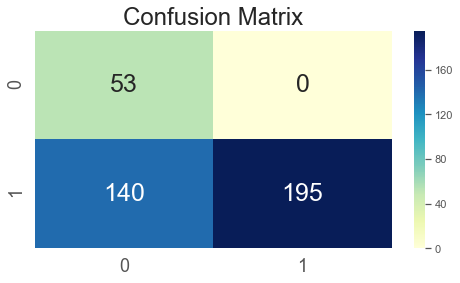

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

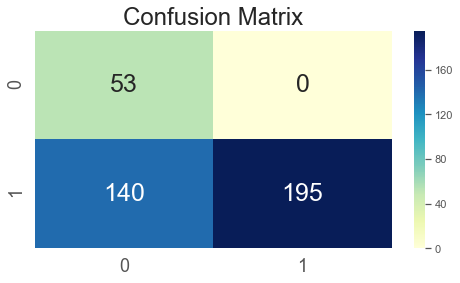

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

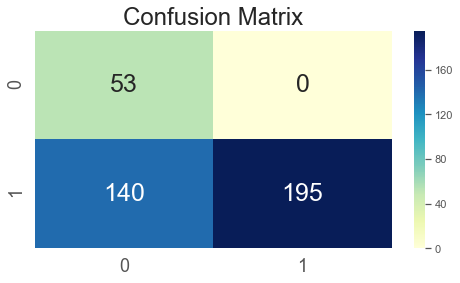

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

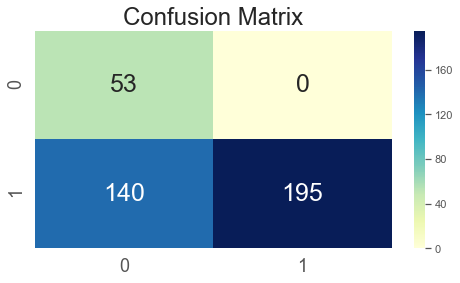

In [43]:
#Fit Cross validation model 
kernel = ['rbf']
OUT_rbf = fitkernelLOOCV(BOW, ytr, kernel, params)

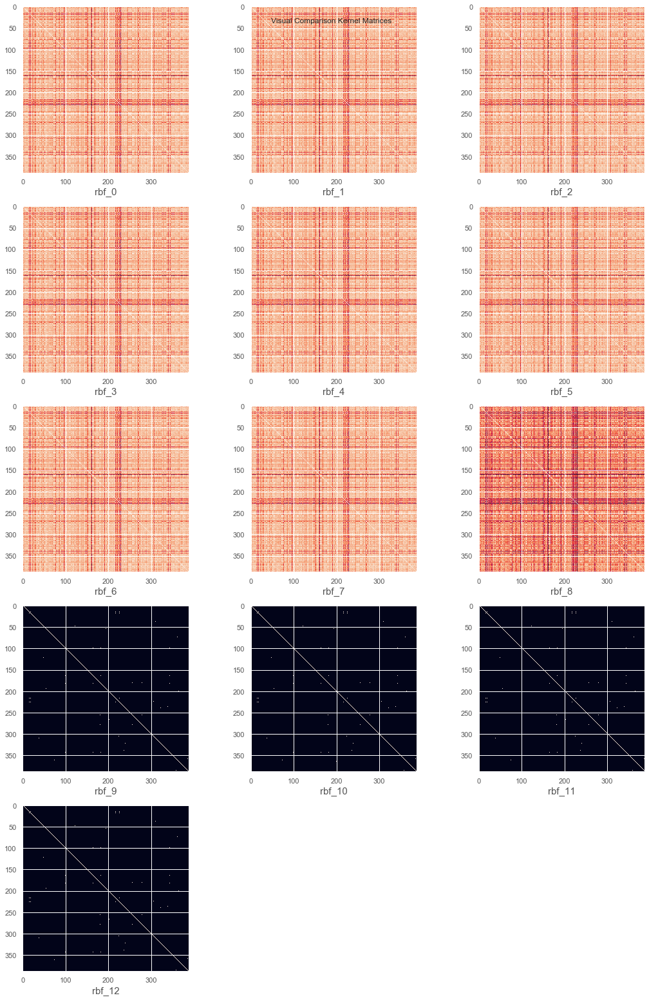

In [44]:
#Analyse performance results
PerfEva_rbf, KerAna_rbf, CVPerf_rbf, CVvalus_rbf  = Analyse_ResultsLOOCV(OUT_rbf)

In [45]:
#Extract performance evaluation
PerfEva_rbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
rbf_0,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_1,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_2,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_3,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_4,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_5,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_6,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_7,195,193,54.38,0.52,1.00,0.5,0.5,0.48,0.00,0.08,0.52,1.00,0.68
rbf_8,195,193,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92
rbf_9,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73


In [46]:
PerfEva_rbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
rbf_0,0.67,50.26,0.50,0.00
rbf_1,0.67,50.26,0.50,0.00
rbf_2,0.67,50.26,0.50,0.00
rbf_3,0.67,50.26,0.50,0.00
rbf_4,0.67,50.26,0.50,0.00
rbf_5,0.67,50.26,0.50,0.00
rbf_6,0.67,50.26,0.50,0.00
rbf_7,0.68,54.38,0.52,1.00
rbf_8,0.92,92.27,0.89,0.96
rbf_9,0.73,63.92,0.58,1.00


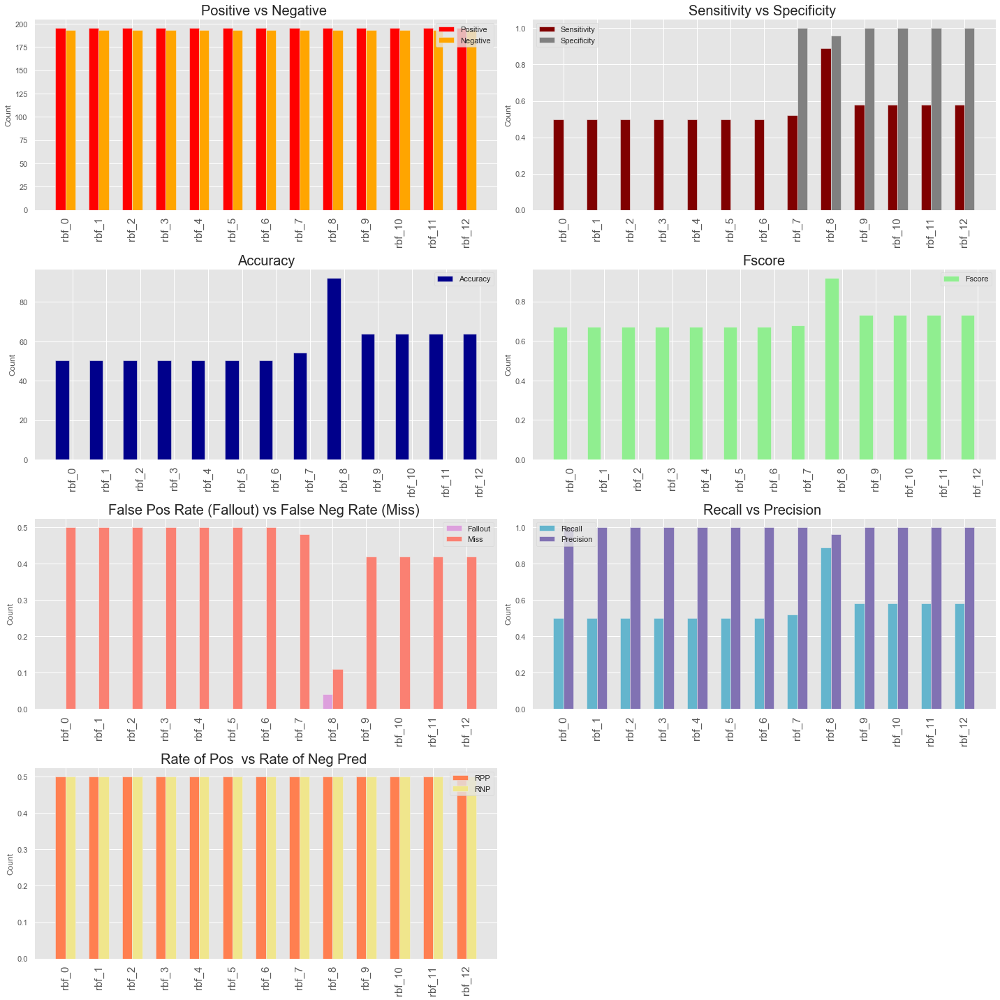

In [47]:
#visualize results
plotResult(PerfEva_rbf)

In [48]:
#Extract best performing parameter
id_rbf = PerfEva_rbf.reset_index().Fscore.argmax()
max_Params_rbf = params[kernel[0]][id_rbf]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_rbf.Fscore[id_rbf]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_rbf.Accu[id_rbf]}')

Best Fscore obtained with rbf kernel   - > 0.92
Best Accuracy obtained with rbf kernel - > 92.27


In [49]:
#Best result showing the specific kernel
BestRes_rbf = pd.DataFrame(PerfEva_rbf.iloc[id_rbf,:]).T
#index with ref to specific kernel removed. 
BestRes_rbf = BestRes_rbf.reset_index().drop(['index'], axis =1)
BestRes_rbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92


In [50]:
BestRes_rbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,92.27,0.89,0.96


In [51]:
#Perf mean score and std
CVPerf_rbf.round(2)

,mean score,std
rbf_0,0.50,0.50
rbf_1,0.50,0.50
rbf_2,0.50,0.50
rbf_3,0.50,0.50
rbf_4,0.50,0.50
rbf_5,0.50,0.50
rbf_6,0.50,0.50
rbf_7,0.54,0.50
rbf_8,0.92,0.27
rbf_9,0.64,0.48


In [52]:
#Extract best score mean/std
Bestscore_rbf = pd.DataFrame(CVPerf_rbf.iloc[id_rbf,:]).T.round(2)
Bestscore_rbf = Bestscore_rbf.reset_index().drop(['index'], axis =1)
Bestscore_rbf

,mean score,std
0,0.92,0.27


In [53]:
#Kernel performance
KerAna_rbf

,train_kernel_time,diag_Dominance,is_PSD
rbf_0,2.60407,False,True
rbf_1,2.56141,False,True
rbf_2,2.69171,False,True
rbf_3,2.48925,False,True
rbf_4,2.50919,False,True
rbf_5,3.11404,False,True
rbf_6,2.74738,False,True
rbf_7,2.50217,False,True
rbf_8,2.59903,False,True
rbf_9,2.62206,False,False


In [54]:
#Extract best score mean/std
BestAnalysis_rbf = pd.DataFrame(KerAna_rbf.iloc[id_rbf,:]).T
BestAnalysis_rbf = BestAnalysis_rbf.reset_index().drop(['index'], axis =1)
BestAnalysis_rbf

,train_kernel_time,diag_Dominance,is_PSD
0,2.59903,False,True


## eRBF Kernel

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

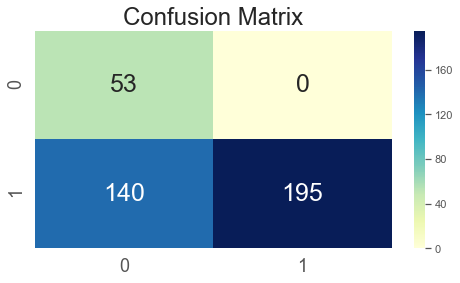

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

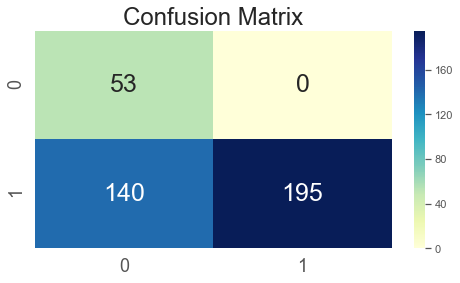

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

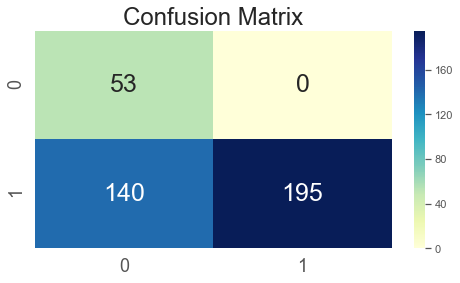

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

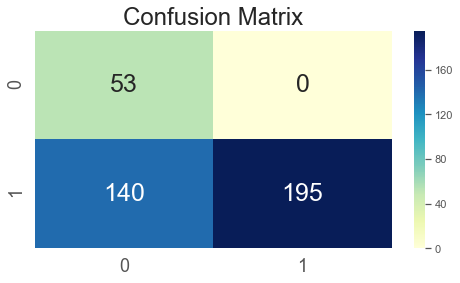

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

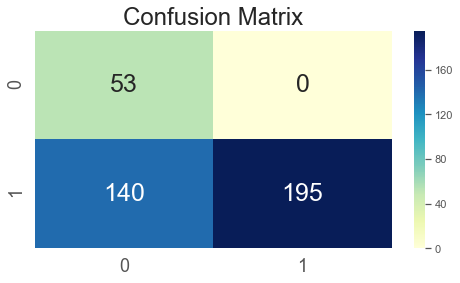

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

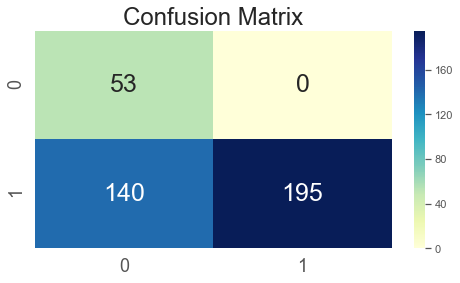

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

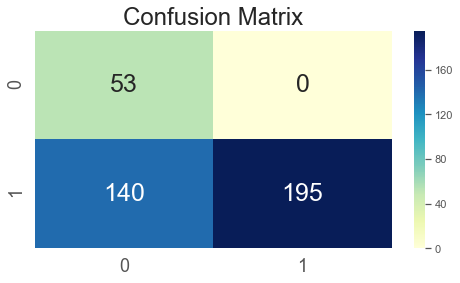

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

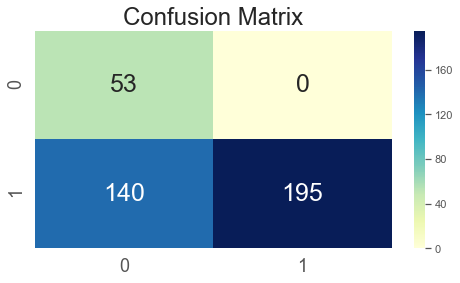

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.639 (0.480)
--> The total of 388 predicted with only 248 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  53
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  140


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 63.92 % was achieved
--> Sensitity of 0.58 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.42 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.27
--> Recall value 0f 0.58 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.73 achie

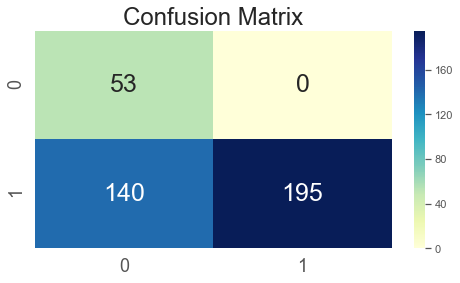

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.902 (0.297)
--> The total of 388 predicted with only 350 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  191
Actual label is False while we predicted False -  True Negatve   =  159
Actual label is False while we predicted True  -  False Positive =  4
Actual label is True while we predicted False  -  False Negative =  34


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.21 % was achieved
--> Sensitity of 0.85 was achieved
--> Specificity of 0.98 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.15 false negative rate was achieved
--> 0.02 false positve rate (fallout) was achieved
--> Negative predictive value of 0.82
--> Recall value 0f 0.85 achieved
--> The precision vaue of 0.98 achieved
--> An Fscore of 0.91 achieved


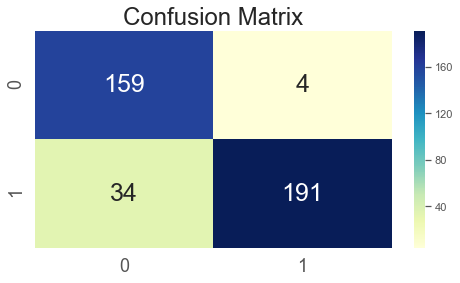

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.889 (0.314)
--> The total of 388 predicted with only 345 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  190
Actual label is False while we predicted False -  True Negatve   =  155
Actual label is False while we predicted True  -  False Positive =  5
Actual label is True while we predicted False  -  False Negative =  38


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 88.92 % was achieved
--> Sensitity of 0.83 was achieved
--> Specificity of 0.97 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.17 false negative rate was achieved
--> 0.03 false positve rate (fallout) was achieved
--> Negative predictive value of 0.8
--> Recall value 0f 0.83 achieved
--> The precision vaue of 0.97 achieved
--> An Fscore of 0.89 achieved


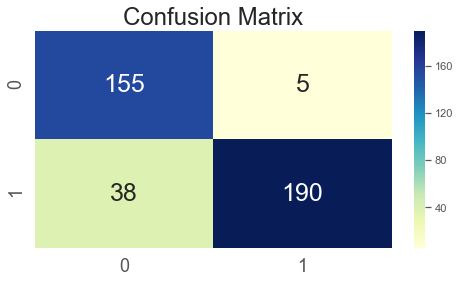

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

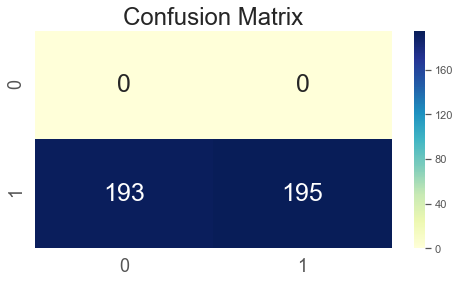

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

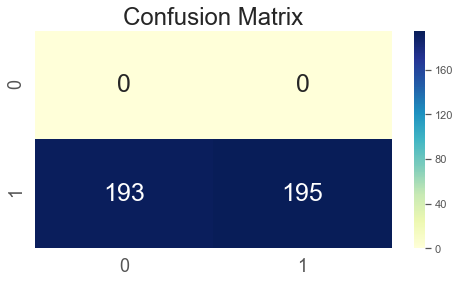

In [55]:
#Fit Cross validation model 
kernel = ['erbf']
OUT_erbf = fitkernelLOOCV(BOW, ytr, kernel, params)

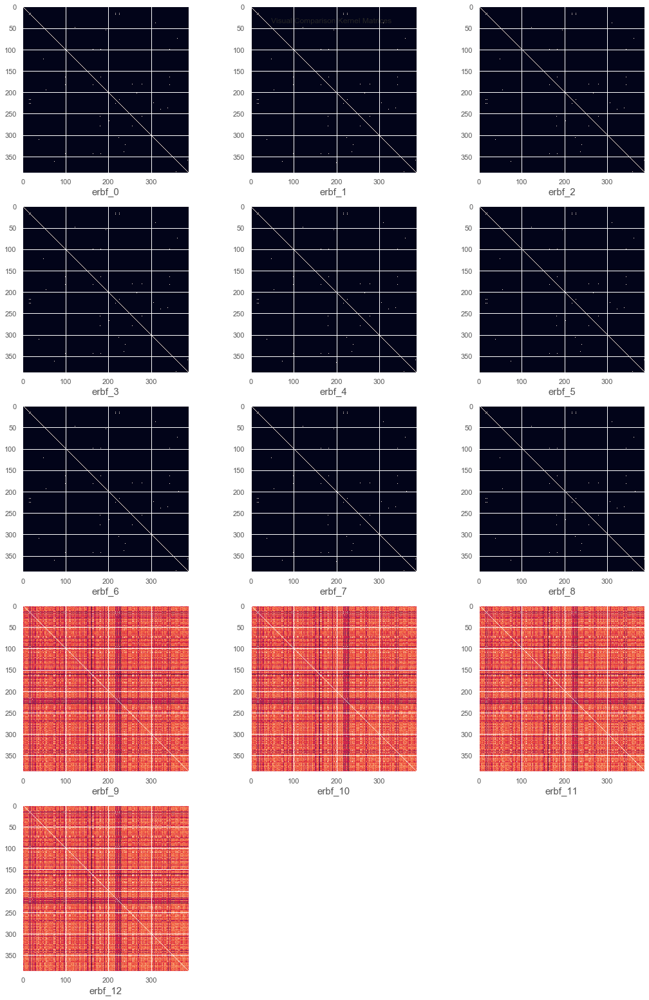

In [56]:
#Analyse performance results
PerfEva_erbf, KerAna_erbf, CVPerf_erbf, CVvalus_erbf  = Analyse_ResultsLOOCV(OUT_erbf)

In [57]:
#Extract performance evaluation
PerfEva_erbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
erbf_0,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_1,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_2,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_3,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_4,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_5,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_6,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_7,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_8,195,193,63.92,0.58,1.00,0.5,0.5,0.42,0.00,0.27,0.58,1.00,0.73
erbf_9,195,193,90.21,0.85,0.98,0.5,0.5,0.15,0.02,0.82,0.85,0.98,0.91


In [58]:
PerfEva_erbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
erbf_0,0.73,63.92,0.58,1.00
erbf_1,0.73,63.92,0.58,1.00
erbf_2,0.73,63.92,0.58,1.00
erbf_3,0.73,63.92,0.58,1.00
erbf_4,0.73,63.92,0.58,1.00
erbf_5,0.73,63.92,0.58,1.00
erbf_6,0.73,63.92,0.58,1.00
erbf_7,0.73,63.92,0.58,1.00
erbf_8,0.73,63.92,0.58,1.00
erbf_9,0.91,90.21,0.85,0.98


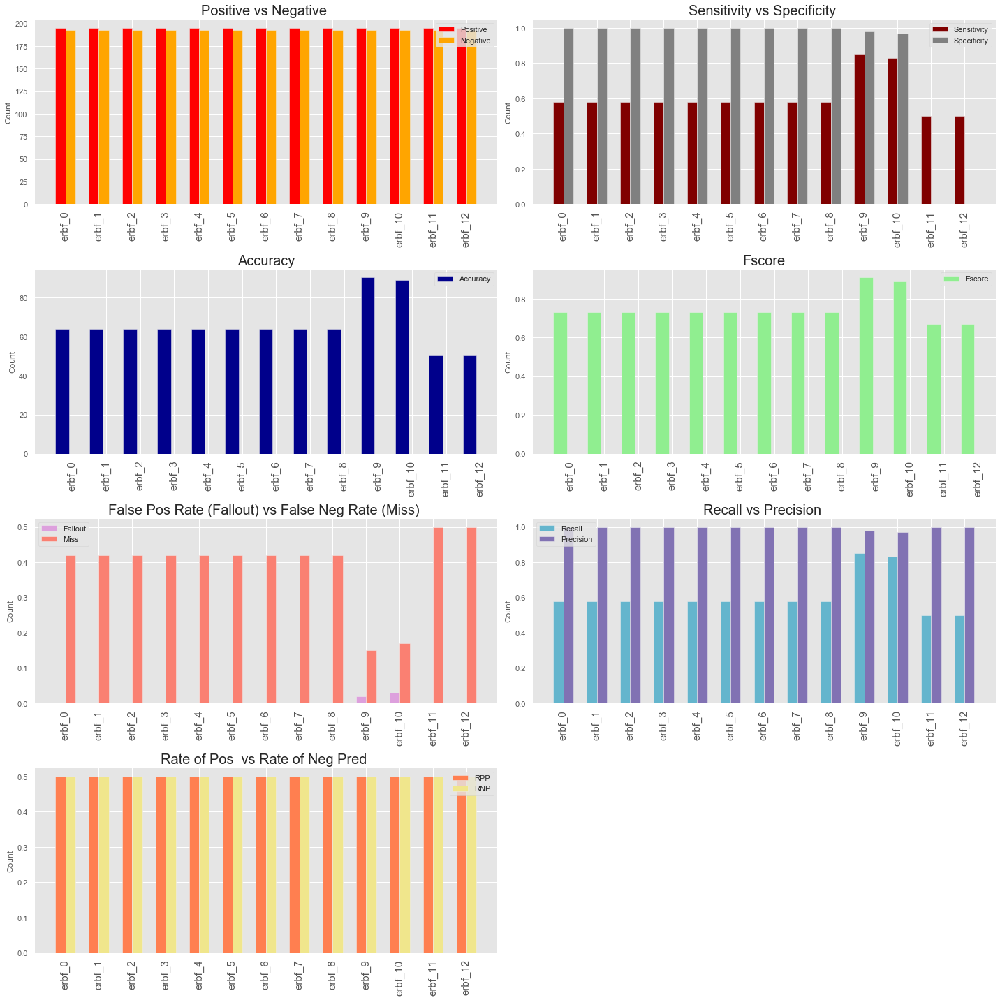

In [59]:
#visualize results
plotResult(PerfEva_erbf)

In [60]:
#Extract best performing parameter
id_erbf = PerfEva_erbf.reset_index().Fscore.argmax()
max_Params_erbf = params[kernel[0]][id_erbf]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_erbf.Fscore[id_erbf]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_erbf.Accu[id_erbf]}')

Best Fscore obtained with erbf kernel   - > 0.91
Best Accuracy obtained with erbf kernel - > 90.21


In [61]:
#Best result showing the specific kernel
BestRes_erbf = pd.DataFrame(PerfEva_erbf.iloc[id_erbf,:]).T
#index with ref to specific kernel removed. 
BestRes_erbf = BestRes_erbf.reset_index().drop(['index'], axis =1)
BestRes_erbf

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,90.21,0.85,0.98,0.5,0.5,0.15,0.02,0.82,0.85,0.98,0.91


In [62]:
BestRes_erbf[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.91,90.21,0.85,0.98


In [63]:
#Perf mean score and std
CVPerf_erbf.round(2)

,mean score,std
erbf_0,0.64,0.48
erbf_1,0.64,0.48
erbf_2,0.64,0.48
erbf_3,0.64,0.48
erbf_4,0.64,0.48
erbf_5,0.64,0.48
erbf_6,0.64,0.48
erbf_7,0.64,0.48
erbf_8,0.64,0.48
erbf_9,0.90,0.30


In [64]:
#Extract best score mean/std
Bestscore_erbf = pd.DataFrame(CVPerf_erbf.iloc[id_erbf,:]).T.round(2)
Bestscore_erbf = Bestscore_erbf.reset_index().drop(['index'], axis =1)
Bestscore_erbf

,mean score,std
0,0.9,0.3


In [65]:
#Kernel performance
KerAna_erbf

,train_kernel_time,diag_Dominance,is_PSD
erbf_0,3.08083,False,False
erbf_1,3.07807,False,False
erbf_2,3.0692,False,False
erbf_3,3.48041,False,False
erbf_4,3.29154,False,False
erbf_5,3.09986,False,False
erbf_6,3.26047,False,False
erbf_7,3.02913,False,False
erbf_8,2.85363,False,False
erbf_9,2.84514,False,True


In [66]:
#Extract best score mean/std
BestAnalysis_erbf = pd.DataFrame(KerAna_erbf.iloc[id_erbf,:]).T
BestAnalysis_erbf = BestAnalysis_erbf.reset_index().drop(['index'], axis =1)
BestAnalysis_erbf

,train_kernel_time,diag_Dominance,is_PSD
0,2.84514,False,True


## Laplace Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


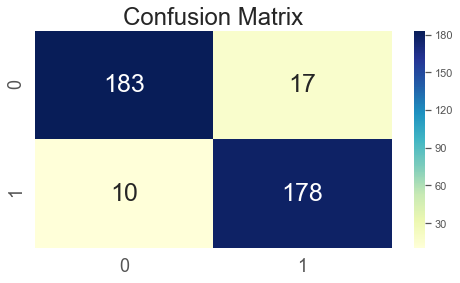

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


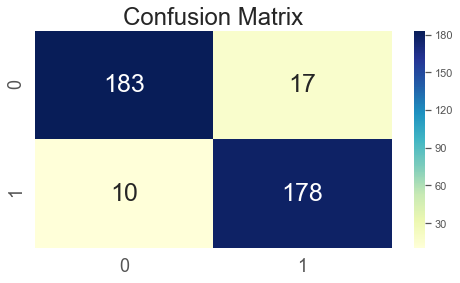

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


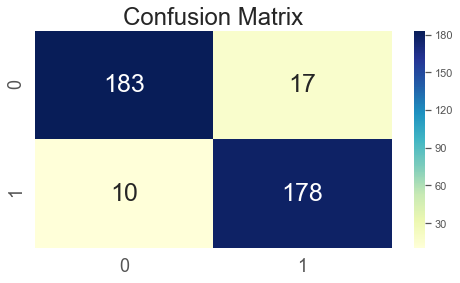

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


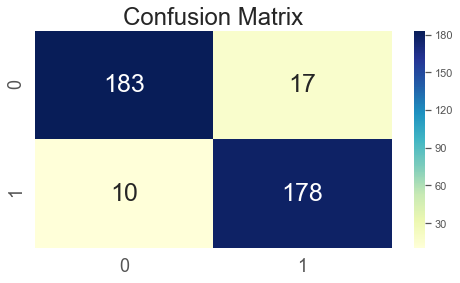

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


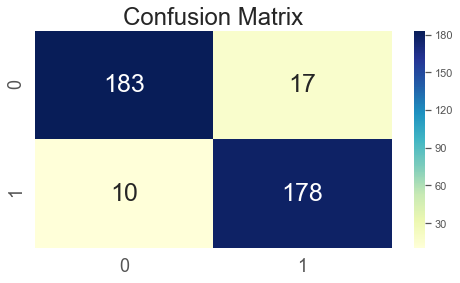

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


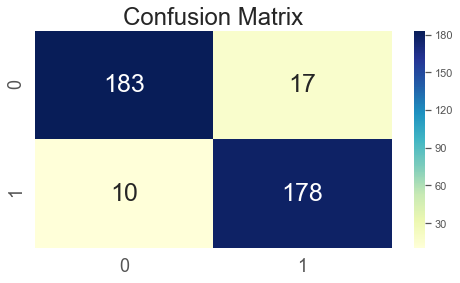

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


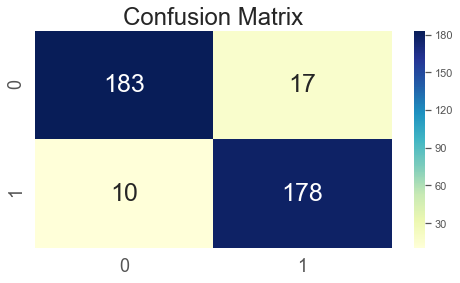

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


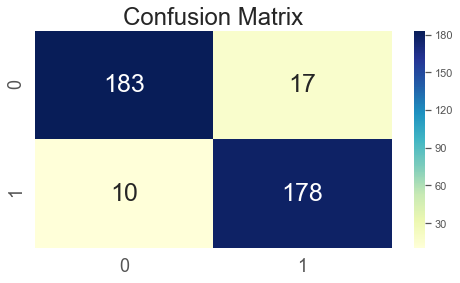

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.930 (0.254)
--> The total of 388 predicted with only 361 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.04 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.92 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.08 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.93 achieved


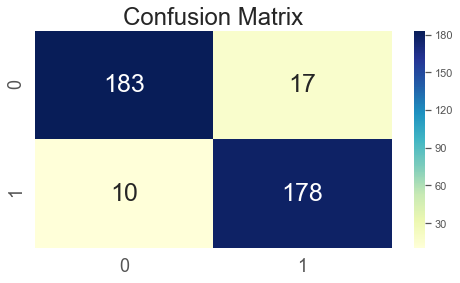

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.954 (0.210)
--> The total of 388 predicted with only 370 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  188
Actual label is False while we predicted False -  True Negatve   =  182
Actual label is False while we predicted True  -  False Positive =  7
Actual label is True while we predicted False  -  False Negative =  11


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 95.36 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.96 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.04 false positve rate (fallout) was achieved
--> Negative predictive value of 0.94
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.96 achieved
--> An Fscore of 0.95 achieved


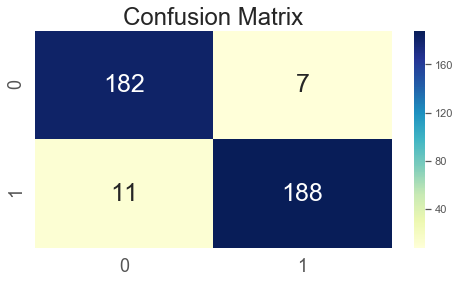

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.948 (0.221)
--> The total of 388 predicted with only 368 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  186
Actual label is False while we predicted False -  True Negatve   =  182
Actual label is False while we predicted True  -  False Positive =  9
Actual label is True while we predicted False  -  False Negative =  11


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 94.85 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.95 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.05 false positve rate (fallout) was achieved
--> Negative predictive value of 0.94
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.95 achieved
--> An Fscore of 0.94 achieved


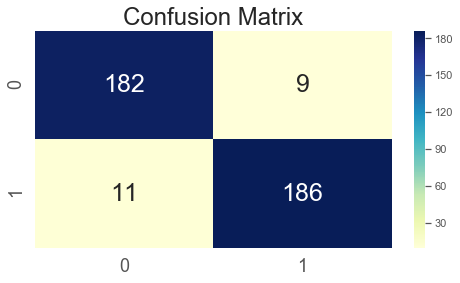

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.936 (0.246)
--> The total of 388 predicted with only 363 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  188
Actual label is False while we predicted False -  True Negatve   =  175
Actual label is False while we predicted True  -  False Positive =  7
Actual label is True while we predicted False  -  False Negative =  18


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 93.56 % was achieved
--> Sensitity of 0.91 was achieved
--> Specificity of 0.96 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.09 false negative rate was achieved
--> 0.04 false positve rate (fallout) was achieved
--> Negative predictive value of 0.91
--> Recall value 0f 0.91 achieved
--> The precision vaue of 0.96 achieved
--> An Fscore of 0.93 achieved


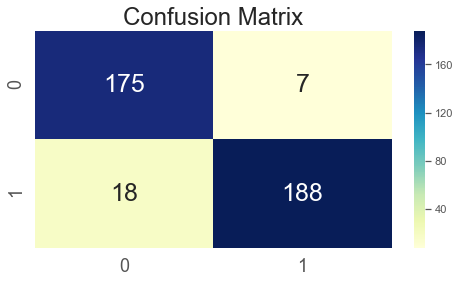

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.902 (0.297)
--> The total of 388 predicted with only 350 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  188
Actual label is False while we predicted False -  True Negatve   =  162
Actual label is False while we predicted True  -  False Positive =  7
Actual label is True while we predicted False  -  False Negative =  31


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.21 % was achieved
--> Sensitity of 0.86 was achieved
--> Specificity of 0.96 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.14 false negative rate was achieved
--> 0.04 false positve rate (fallout) was achieved
--> Negative predictive value of 0.84
--> Recall value 0f 0.86 achieved
--> The precision vaue of 0.96 achieved
--> An Fscore of 0.91 achieved


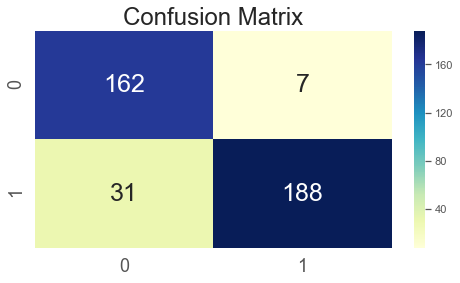

In [67]:
#Fit Cross validation model 
kernel = ['laplace']
OUT_laplace = fitkernelLOOCV(BOW, ytr, kernel, params)

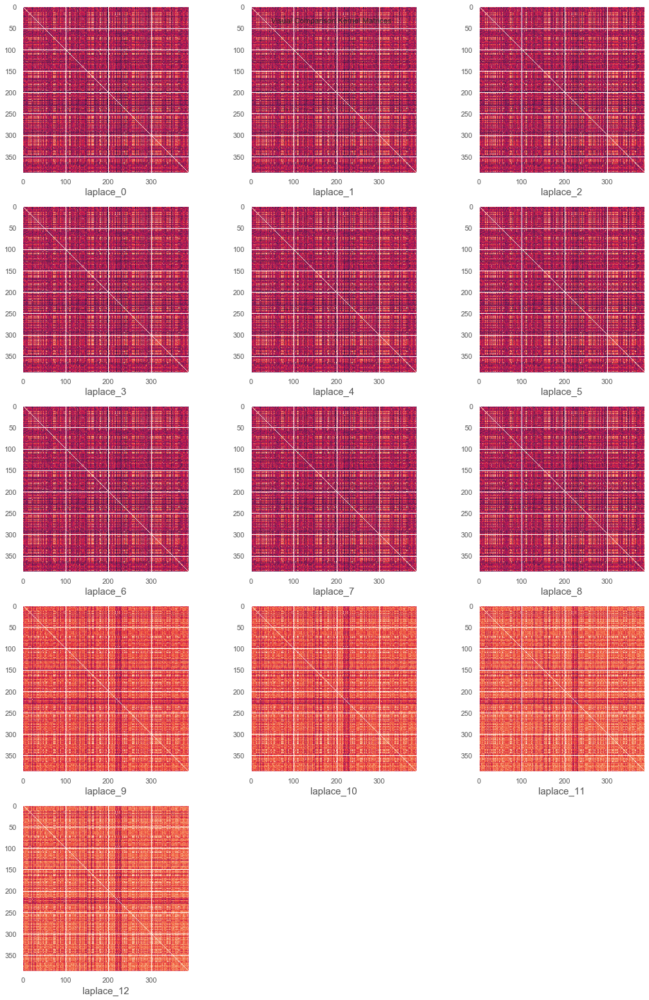

In [68]:
#Analyse performance results
PerfEva_laplace, KerAna_laplace, CVPerf_laplace, CVvalus_laplace  = Analyse_ResultsLOOCV(OUT_laplace)

In [69]:
#Extract performance evaluation
PerfEva_laplace

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
laplace_0,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_1,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_2,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_3,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_4,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_5,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_6,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_7,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_8,195,193,93.04,0.95,0.92,0.5,0.5,0.05,0.08,0.95,0.95,0.91,0.93
laplace_9,195,193,95.36,0.94,0.96,0.5,0.5,0.06,0.04,0.94,0.94,0.96,0.95


In [70]:
PerfEva_laplace[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
laplace_0,0.93,93.04,0.95,0.92
laplace_1,0.93,93.04,0.95,0.92
laplace_2,0.93,93.04,0.95,0.92
laplace_3,0.93,93.04,0.95,0.92
laplace_4,0.93,93.04,0.95,0.92
laplace_5,0.93,93.04,0.95,0.92
laplace_6,0.93,93.04,0.95,0.92
laplace_7,0.93,93.04,0.95,0.92
laplace_8,0.93,93.04,0.95,0.92
laplace_9,0.95,95.36,0.94,0.96


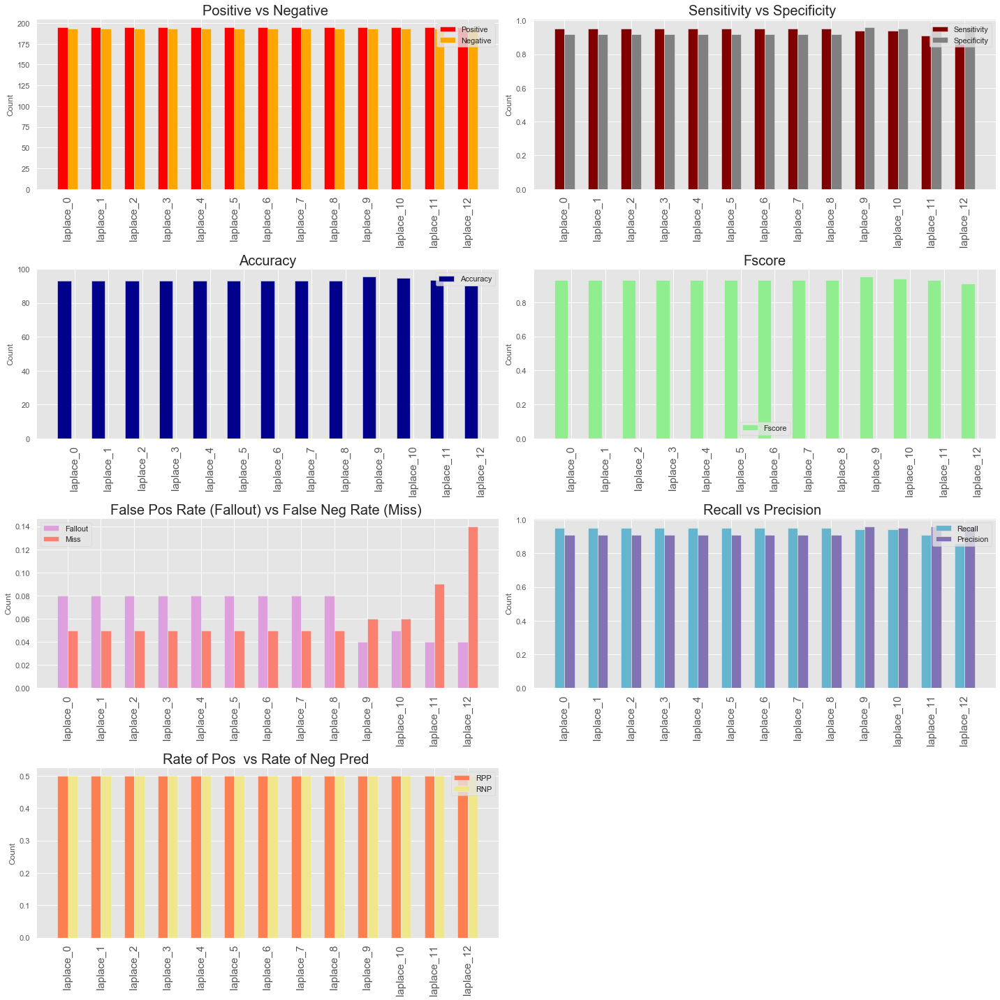

In [71]:
#visualize results
plotResult(PerfEva_laplace)

In [72]:
#Extract best performing parameter
id_laplace = PerfEva_laplace.reset_index().Fscore.argmax()
max_Params_laplace = params[kernel[0]][id_laplace]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_laplace.Fscore[id_laplace]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_laplace.Accu[id_laplace]}')

Best Fscore obtained with laplace kernel   - > 0.95
Best Accuracy obtained with laplace kernel - > 95.36


In [73]:
#Best result showing the specific kernel
BestRes_laplace = pd.DataFrame(PerfEva_laplace.iloc[id_laplace,:]).T
#index with ref to specific kernel removed. 
BestRes_laplace = BestRes_laplace.reset_index().drop(['index'], axis =1)
BestRes_laplace

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,95.36,0.94,0.96,0.5,0.5,0.06,0.04,0.94,0.94,0.96,0.95


In [74]:
BestRes_laplace[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.95,95.36,0.94,0.96


In [75]:
#Perf mean score and std
CVPerf_laplace.round(2)

,mean score,std
laplace_0,0.93,0.25
laplace_1,0.93,0.25
laplace_2,0.93,0.25
laplace_3,0.93,0.25
laplace_4,0.93,0.25
laplace_5,0.93,0.25
laplace_6,0.93,0.25
laplace_7,0.93,0.25
laplace_8,0.93,0.25
laplace_9,0.95,0.21


In [76]:
#Extract best score mean/std
Bestscore_laplace = pd.DataFrame(CVPerf_laplace.iloc[id_laplace,:]).T.round(2)
Bestscore_laplace = Bestscore_laplace.reset_index().drop(['index'], axis =1)
Bestscore_laplace

,mean score,std
0,0.95,0.21


In [77]:
#Kernel performance
KerAna_laplace

,train_kernel_time,diag_Dominance,is_PSD
laplace_0,3.25768,False,True
laplace_1,3.29731,False,True
laplace_2,3.23263,False,True
laplace_3,3.23011,False,True
laplace_4,3.21309,False,True
laplace_5,3.0742,False,True
laplace_6,2.9664,False,True
laplace_7,2.92228,False,True
laplace_8,2.89371,False,True
laplace_9,2.90424,False,True


In [78]:
#Extract best score mean/std
BestAnalysis_laplace = pd.DataFrame(KerAna_laplace.iloc[id_laplace,:]).T
BestAnalysis_laplace = BestAnalysis_laplace.reset_index().drop(['index'], axis =1)
BestAnalysis_laplace

,train_kernel_time,diag_Dominance,is_PSD
0,2.90424,False,True


## Compare Results from all Kernels

In [79]:
#Combine all result dataFrames
framesAll = [BestRes_linear,BestRes_rbf,BestRes_erbf, BestRes_poly,BestRes_H_poly,BestRes_laplace]
All_Res_df = pd.concat(framesAll)
All_Res_df.index = ['linear','rbf','erbf','poly','H_poly','laplace']
All_Res_df

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear,195.0,193.0,92.01,0.93,0.91,0.5,0.5,0.07,0.09,0.93,0.93,0.91,0.92
rbf,195.0,193.0,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92
erbf,195.0,193.0,90.21,0.85,0.98,0.5,0.5,0.15,0.02,0.82,0.85,0.98,0.91
poly,195.0,193.0,93.56,0.93,0.94,0.5,0.5,0.07,0.06,0.93,0.93,0.94,0.93
H_poly,195.0,193.0,92.78,0.93,0.93,0.5,0.5,0.07,0.07,0.93,0.93,0.93,0.93
laplace,195.0,193.0,95.36,0.94,0.96,0.5,0.5,0.06,0.04,0.94,0.94,0.96,0.95


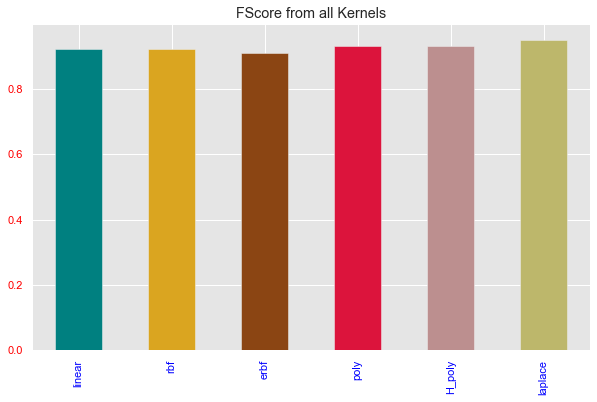

In [80]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki']
All_Res_df.Fscore.plot(kind='bar', color=c);
plt.title('FScore from all Kernels');

In [81]:
#Extract and print the kernel with the best F1 Score
idc   = All_Res_df.reset_index().Fscore.argmax()
score = All_Res_df.Fscore.max()
print(f'{All_Res_df.index[idc]} Kernel had the best F1 Score of {score}')

laplace Kernel had the best F1 Score of 0.95


In [82]:
#Cut down dataframe 
All_Res_df[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear,0.92,92.01,0.93,0.91
rbf,0.92,92.27,0.89,0.96
erbf,0.91,90.21,0.85,0.98
poly,0.93,93.56,0.93,0.94
H_poly,0.93,92.78,0.93,0.93
laplace,0.95,95.36,0.94,0.96


# LOOCV - On Binary Bag-Of-Words features

## Linear Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.915 (0.279)
--> The total of 388 predicted with only 355 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  178
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  17
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 91.49 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.91 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.09 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.91 achieved
--> An Fscore of 0.91 achieved


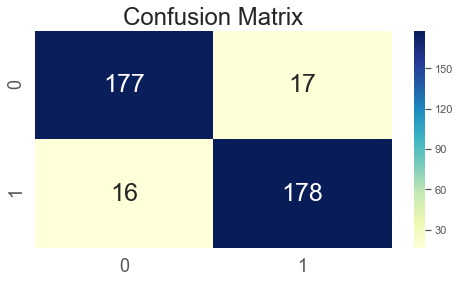

In [83]:
#Fit Cross validation model 
kernel = ['linear']
OUT_linear_b = fitkernelLOOCV(BIN, ytr, kernel, params)

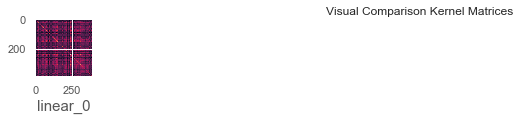

In [84]:
#Analyse performance results
PerfEva_linear_b, KerAna_linear_b, CVPerf_linear_b, CVvalus_linear_b  = Analyse_ResultsLOOCV(OUT_linear_b)

In [85]:
#Extract performance evaluation
PerfEva_linear_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_0,195,193,91.49,0.92,0.91,0.5,0.5,0.08,0.09,0.92,0.92,0.91,0.91


In [86]:
PerfEva_linear_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_0,0.91,91.49,0.92,0.91


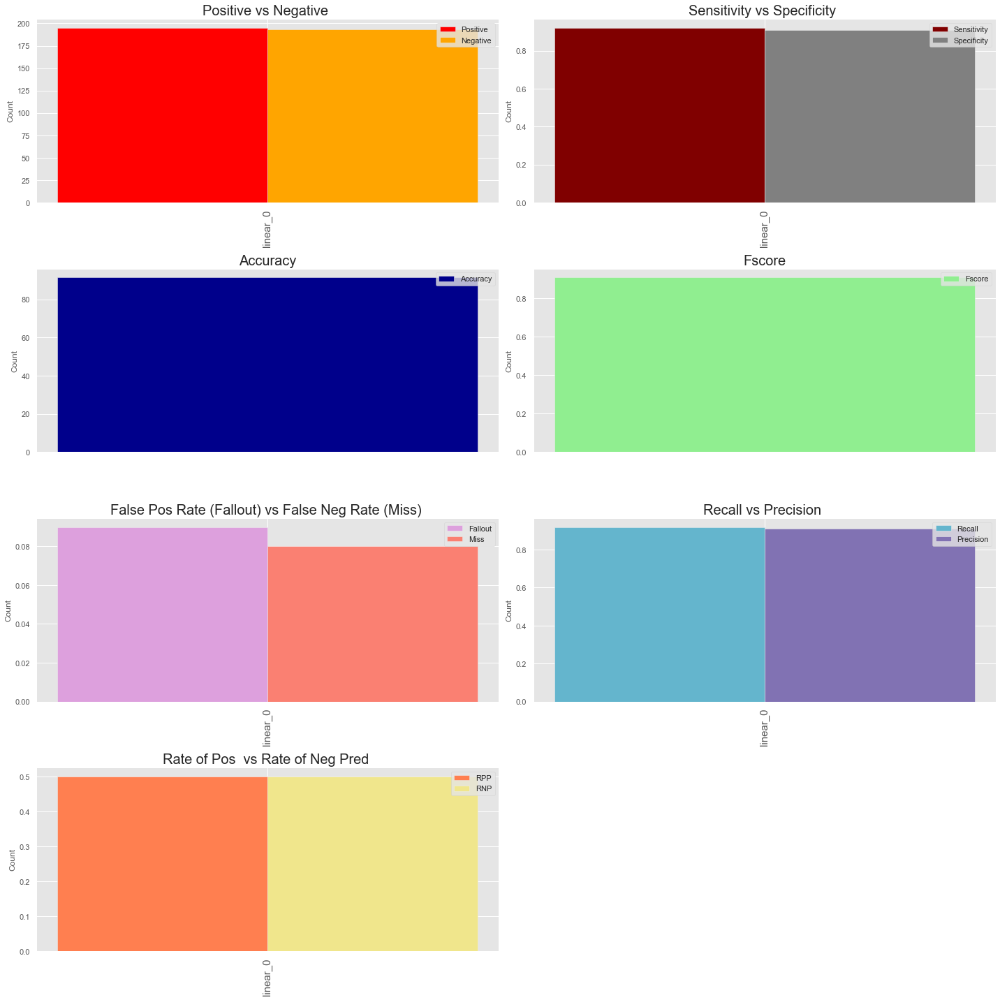

In [87]:
#visualize results
plotResult(PerfEva_linear_b)

In [88]:
#Extract best performing parameter
id_linear_b = PerfEva_linear_b.reset_index().Fscore.argmax()
max_Params_linear_b = params[kernel[0]][id_linear_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_linear_b.Fscore[id_linear_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_linear_b.Accu[id_linear_b]}')

Best Fscore obtained with linear kernel   - > 0.91
Best Accuracy obtained with linear kernel - > 91.49


In [89]:
#Best result showing the specific kernel
BestRes_linear_b = pd.DataFrame(PerfEva_linear_b.iloc[id_linear_b,:]).T
#index with ref to specific kernel removed. 
BestRes_linear_b = BestRes_linear_b.reset_index().drop(['index'], axis =1)
BestRes_linear_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,91.49,0.92,0.91,0.5,0.5,0.08,0.09,0.92,0.92,0.91,0.91


In [90]:
BestRes_linear_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.91,91.49,0.92,0.91


In [91]:
#Perf mean score and std
CVPerf_linear_b.round(4)

,mean score,std
linear_0,0.9149,0.279


In [92]:
#Extract best score mean/std
Bestscore_linear_b = pd.DataFrame(CVPerf_linear_b.iloc[id_linear_b,:]).T.round(2)
Bestscore_linear_b = Bestscore_linear_b.reset_index().drop(['index'], axis =1)
Bestscore_linear_b

,mean score,std
0,0.91,0.28


In [93]:
#Kernel performance
KerAna_linear_b

,train_kernel_time,diag_Dominance,is_PSD
linear_0,0.00200605,False,True


In [94]:
#Extract best score mean/std
BestAnalysis_linear_b = pd.DataFrame(KerAna_linear_b.iloc[id_linear_b,:]).T
BestAnalysis_linear_b = BestAnalysis_linear_b.reset_index().drop(['index'], axis =1)
BestAnalysis_linear_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.00200605,False,True


## poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.912 (0.283)
--> The total of 388 predicted with only 354 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  184
Actual label is False while we predicted False -  True Negatve   =  170
Actual label is False while we predicted True  -  False Positive =  11
Actual label is True while we predicted False  -  False Negative =  23


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 91.24 % was achieved
--> Sensitity of 0.89 was achieved
--> Specificity of 0.94 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.11 false negative rate was achieved
--> 0.06 false positve rate (fallout) was achieved
--> Negative predictive value of 0.88
--> Recall value 0f 0.89 achieved
--> The precision vaue of 0.94 achieved
--> An Fscore of 0.91 achieved


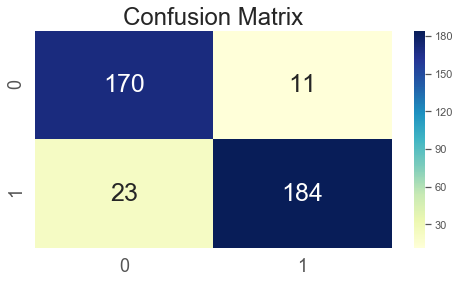

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.923 (0.267)
--> The total of 388 predicted with only 358 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  176
Actual label is False while we predicted False -  True Negatve   =  182
Actual label is False while we predicted True  -  False Positive =  19
Actual label is True while we predicted False  -  False Negative =  11


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.27 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.91 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.09 false positve rate (fallout) was achieved
--> Negative predictive value of 0.94
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.92 achieved


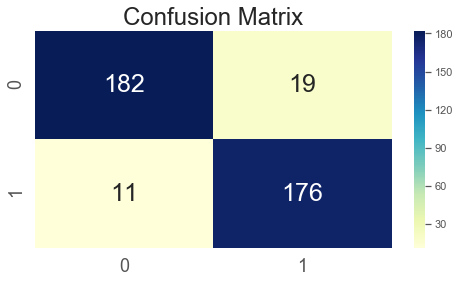

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.923 (0.267)
--> The total of 388 predicted with only 358 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.27 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.92 achieved


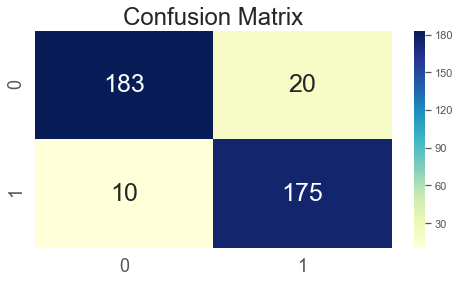

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.920 (0.271)
--> The total of 388 predicted with only 357 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  182
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  11


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.01 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.94
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.92 achieved


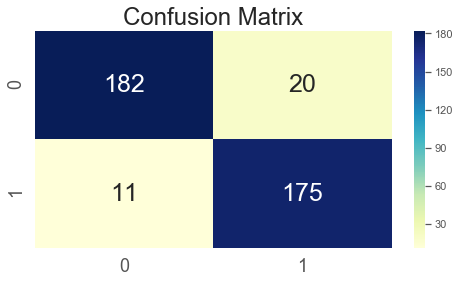

In [95]:
#Fit Cross validation model 
kernel = ['poly']
OUT_poly_b = fitkernelLOOCV(BIN, ytr, kernel, params)

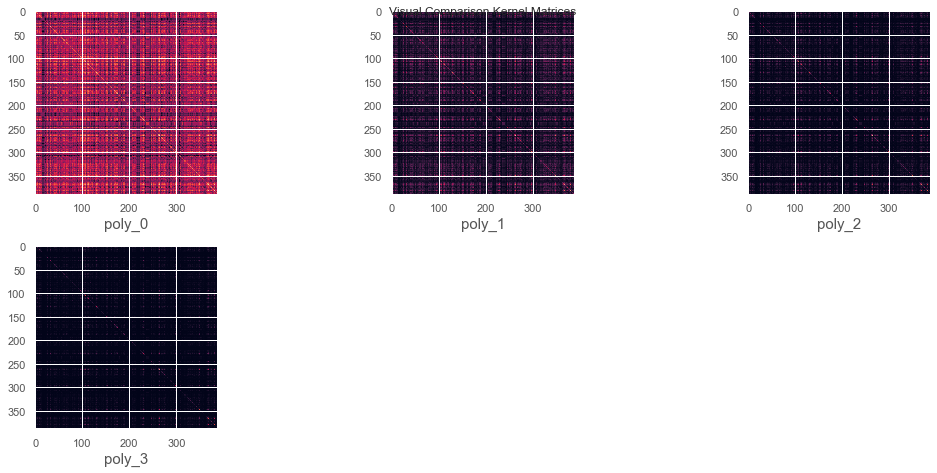

In [96]:
#Analyse performance results
PerfEva_poly_b, KerAna_poly_b, CVPerf_poly_b, CVvalus_poly_b  = Analyse_ResultsLOOCV(OUT_poly_b)

In [97]:
#Extract performance evaluation
PerfEva_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
poly_0,195,193,91.24,0.89,0.94,0.5,0.5,0.11,0.06,0.88,0.89,0.94,0.91
poly_1,195,193,92.27,0.94,0.91,0.5,0.5,0.06,0.09,0.94,0.94,0.90,0.92
poly_2,195,193,92.27,0.95,0.90,0.5,0.5,0.05,0.10,0.95,0.95,0.90,0.92
poly_3,195,193,92.01,0.94,0.90,0.5,0.5,0.06,0.10,0.94,0.94,0.90,0.92


In [98]:
PerfEva_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
poly_0,0.91,91.24,0.89,0.94
poly_1,0.92,92.27,0.94,0.91
poly_2,0.92,92.27,0.95,0.90
poly_3,0.92,92.01,0.94,0.90


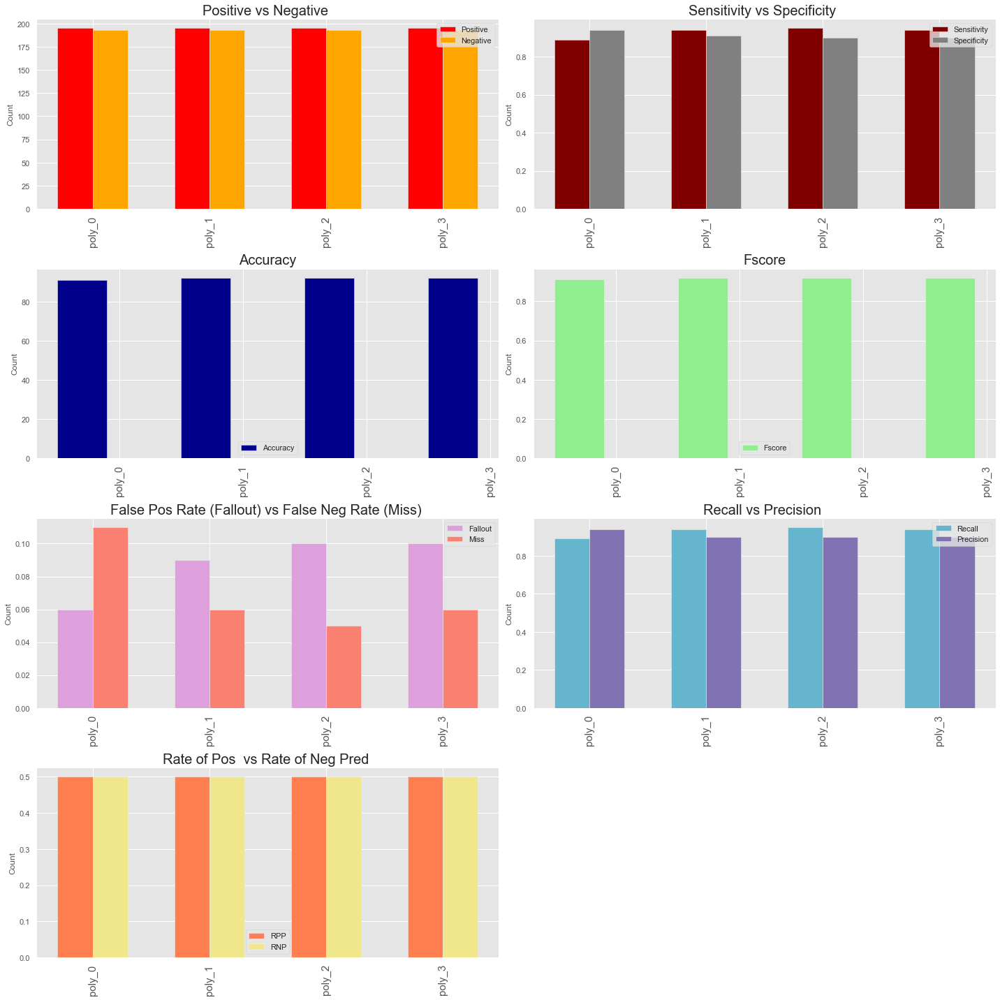

In [99]:
#visualize results
plotResult(PerfEva_poly_b)

In [100]:
#Extract best performing parameter
id_poly_b = PerfEva_poly_b.reset_index().Fscore.argmax()
max_Params_poly_b = params[kernel[0]][id_poly_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_poly_b.Fscore[id_poly_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_poly_b.Accu[id_poly_b]}')

Best Fscore obtained with poly kernel   - > 0.92
Best Accuracy obtained with poly kernel - > 92.27


In [101]:
#Best result showing the specific kernel
BestRes_poly_b = pd.DataFrame(PerfEva_poly_b.iloc[id_poly_b,:]).T
#index with ref to specific kernel removed. 
BestRes_poly_b = BestRes_poly_b.reset_index().drop(['index'], axis =1)
BestRes_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,92.27,0.94,0.91,0.5,0.5,0.06,0.09,0.94,0.94,0.9,0.92


In [102]:
BestRes_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,92.27,0.94,0.91


In [103]:
#Perf mean score and std
CVPerf_poly_b.round(2)

,mean score,std
poly_0,0.91,0.28
poly_1,0.92,0.27
poly_2,0.92,0.27
poly_3,0.92,0.27


In [104]:
#Extract best score mean/std
Bestscore_poly_b = pd.DataFrame(CVPerf_poly_b.iloc[id_poly_b,:]).T.round(2)
Bestscore_poly_b = Bestscore_poly_b.reset_index().drop(['index'], axis =1)
Bestscore_poly_b

,mean score,std
0,0.92,0.27


In [105]:
#Kernel performance
KerAna_poly_b

,train_kernel_time,diag_Dominance,is_PSD
poly_0,0.00501871,False,True
poly_1,0.00501943,False,True
poly_2,0.0160427,False,True
poly_3,0.0160427,False,True


In [106]:
#Extract best score mean/std
BestAnalysis_poly_b = pd.DataFrame(KerAna_poly_b.iloc[id_poly_b,:]).T
BestAnalysis_poly_b = BestAnalysis_poly_b.reset_index().drop(['index'], axis =1)
BestAnalysis_poly_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.00501943,False,True


## H_poly Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.902 (0.297)
--> The total of 388 predicted with only 350 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  179
Actual label is False while we predicted False -  True Negatve   =  171
Actual label is False while we predicted True  -  False Positive =  16
Actual label is True while we predicted False  -  False Negative =  22


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.21 % was achieved
--> Sensitity of 0.89 was achieved
--> Specificity of 0.91 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.11 false negative rate was achieved
--> 0.09 false positve rate (fallout) was achieved
--> Negative predictive value of 0.89
--> Recall value 0f 0.89 achieved
--> The precision vaue of 0.92 achieved
--> An Fscore of 0.9 achieved


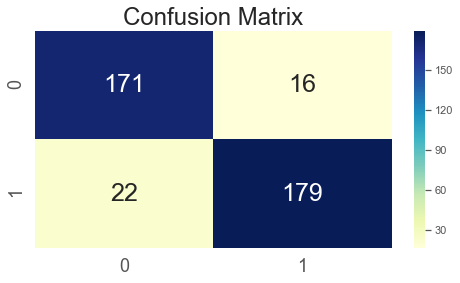

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  170
Actual label is False while we predicted False -  True Negatve   =  182
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  11


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.88 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.12 false positve rate (fallout) was achieved
--> Negative predictive value of 0.94
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.87 achieved
--> An Fscore of 0.9 achieved


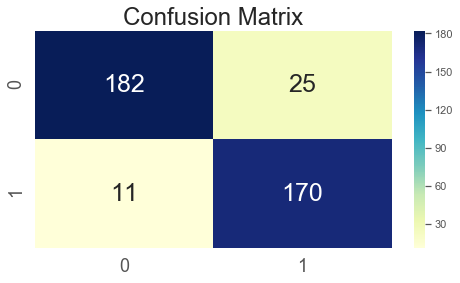

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.918 (0.275)
--> The total of 388 predicted with only 356 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  173
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  22
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 91.75 % was achieved
--> Sensitity of 0.95 was achieved
--> Specificity of 0.89 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.05 false negative rate was achieved
--> 0.11 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.95 achieved
--> The precision vaue of 0.89 achieved
--> An Fscore of 0.92 achieved


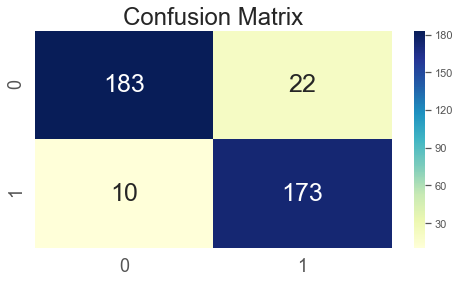

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.910 (0.286)
--> The total of 388 predicted with only 353 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  170
Actual label is False while we predicted False -  True Negatve   =  183
Actual label is False while we predicted True  -  False Positive =  25
Actual label is True while we predicted False  -  False Negative =  10


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.98 % was achieved
--> Sensitity of 0.94 was achieved
--> Specificity of 0.88 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.06 false negative rate was achieved
--> 0.12 false positve rate (fallout) was achieved
--> Negative predictive value of 0.95
--> Recall value 0f 0.94 achieved
--> The precision vaue of 0.87 achieved
--> An Fscore of 0.9 achieved


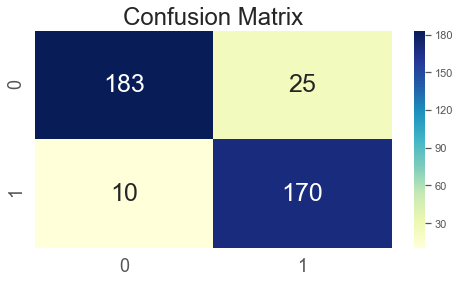

In [107]:
#Fit Cross validation model 
kernel = ['H_poly']
OUT_H_poly_b = fitkernelLOOCV(BIN, ytr, kernel, params)

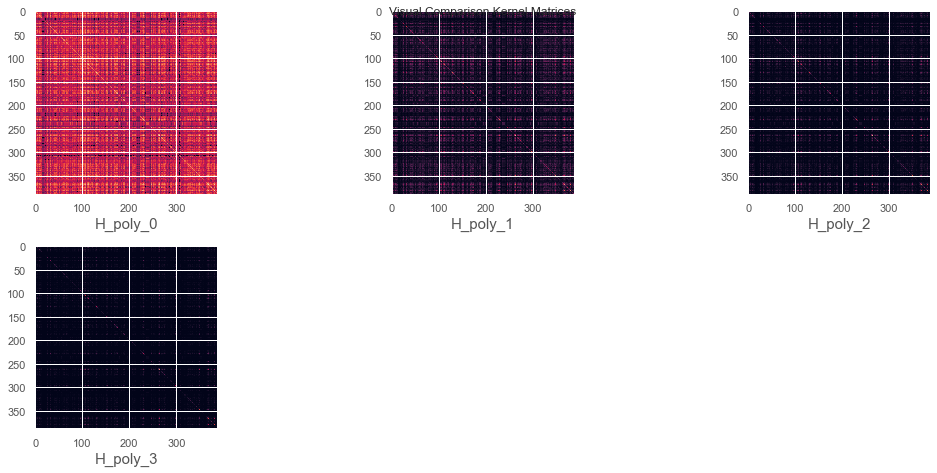

In [108]:
#Analyse performance results
PerfEva_H_poly_b, KerAna_H_poly_b, CVPerf_H_poly_b, CVvalus_H_poly_b  = Analyse_ResultsLOOCV(OUT_H_poly_b)

In [109]:
#Extract performance evaluation
PerfEva_H_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
H_poly_0,195,193,90.21,0.89,0.91,0.5,0.5,0.11,0.09,0.89,0.89,0.92,0.90
H_poly_1,195,193,90.72,0.94,0.88,0.5,0.5,0.06,0.12,0.94,0.94,0.87,0.90
H_poly_2,195,193,91.75,0.95,0.89,0.5,0.5,0.05,0.11,0.95,0.95,0.89,0.92
H_poly_3,195,193,90.98,0.94,0.88,0.5,0.5,0.06,0.12,0.95,0.94,0.87,0.90


In [110]:
PerfEva_H_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
H_poly_0,0.90,90.21,0.89,0.91
H_poly_1,0.90,90.72,0.94,0.88
H_poly_2,0.92,91.75,0.95,0.89
H_poly_3,0.90,90.98,0.94,0.88


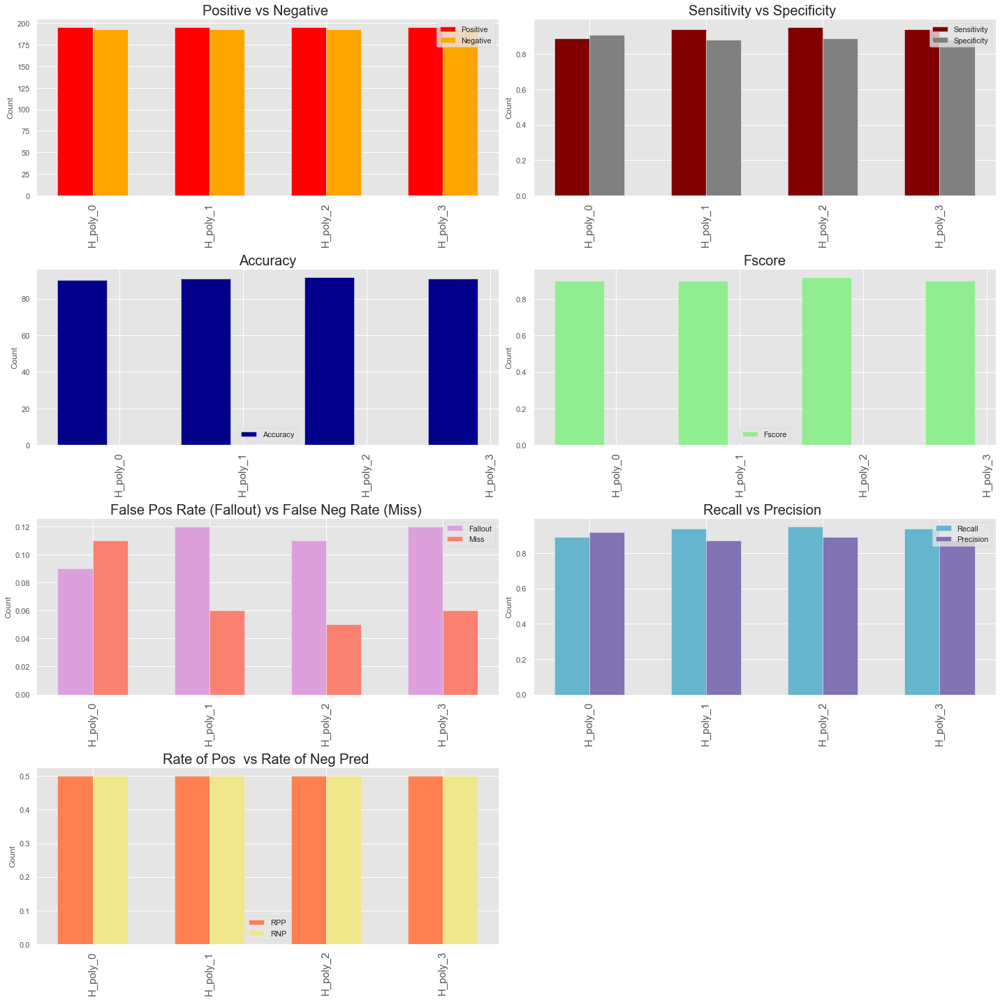

In [111]:
#visualize results
plotResult(PerfEva_H_poly_b)

In [112]:
#Extract best performing parameter
id_H_poly_b = PerfEva_H_poly_b.reset_index().Fscore.argmax()
max_Params_H_poly_b = params[kernel[0]][id_H_poly_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_H_poly_b.Fscore[id_H_poly_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_H_poly_b.Accu[id_H_poly_b]}')

Best Fscore obtained with H_poly kernel   - > 0.92
Best Accuracy obtained with H_poly kernel - > 91.75


In [113]:
#Best result showing the specific kernel
BestRes_H_poly_b = pd.DataFrame(PerfEva_H_poly_b.iloc[id_H_poly_b,:]).T
#index with ref to specific kernel removed. 
BestRes_H_poly_b = BestRes_H_poly_b.reset_index().drop(['index'], axis =1)
BestRes_H_poly_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,91.75,0.95,0.89,0.5,0.5,0.05,0.11,0.95,0.95,0.89,0.92


In [114]:
BestRes_H_poly_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,91.75,0.95,0.89


In [115]:
#Perf mean score and std
CVPerf_H_poly_b.round(2)

,mean score,std
H_poly_0,0.90,0.30
H_poly_1,0.91,0.29
H_poly_2,0.92,0.28
H_poly_3,0.91,0.29


In [116]:
#Extract best score mean/std
Bestscore_H_poly_b = pd.DataFrame(CVPerf_H_poly_b.iloc[id_H_poly_b,:]).T.round(2)
Bestscore_H_poly_b = Bestscore_H_poly_b.reset_index().drop(['index'], axis =1)
Bestscore_H_poly_b

,mean score,std
0,0.92,0.28


In [117]:
#Kernel performance
KerAna_H_poly_b

,train_kernel_time,diag_Dominance,is_PSD
H_poly_0,0.00501347,False,True
H_poly_1,0.00401139,False,True
H_poly_2,0.0135362,False,True
H_poly_3,0.0175464,False,True


In [118]:
#Extract best score mean/std
BestAnalysis_H_poly_b = pd.DataFrame(KerAna_H_poly_b.iloc[id_H_poly_b,:]).T
BestAnalysis_H_poly_b = BestAnalysis_H_poly_b.reset_index().drop(['index'], axis =1)
BestAnalysis_H_poly_b

,train_kernel_time,diag_Dominance,is_PSD
0,0.0135362,False,True


## RBF Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

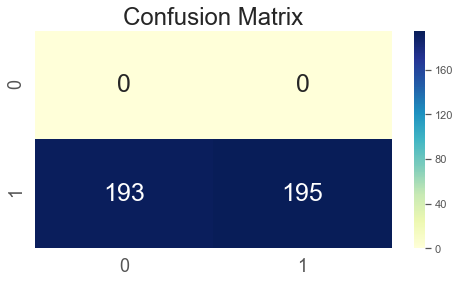

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

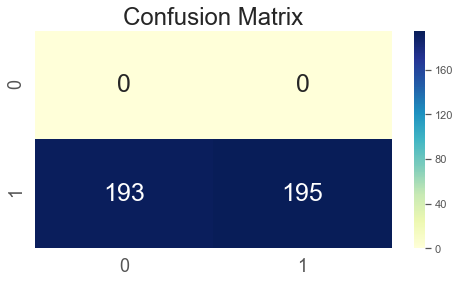

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

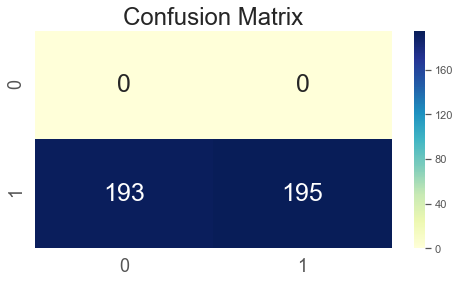

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

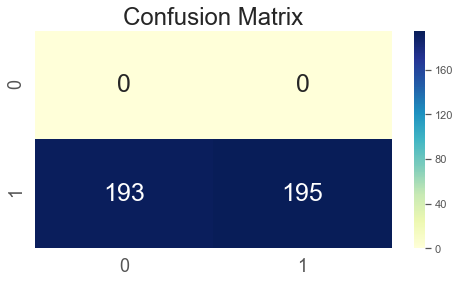

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

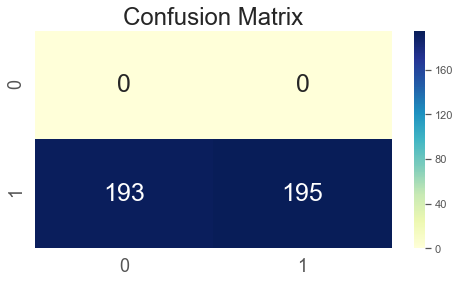

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

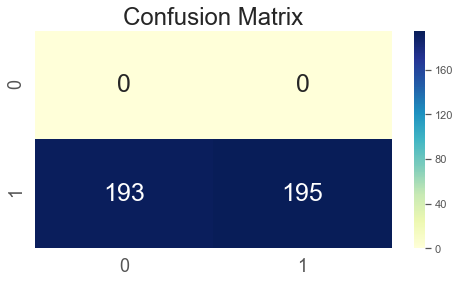

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

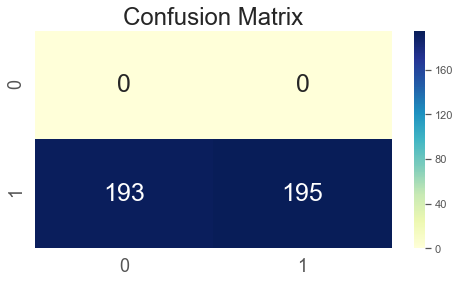

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

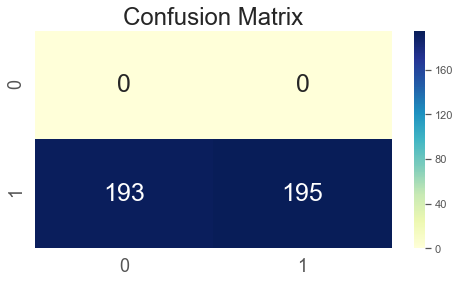

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.920 (0.271)
--> The total of 388 predicted with only 357 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  184
Actual label is False while we predicted False -  True Negatve   =  173
Actual label is False while we predicted True  -  False Positive =  11
Actual label is True while we predicted False  -  False Negative =  20


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.01 % was achieved
--> Sensitity of 0.9 was achieved
--> Specificity of 0.94 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.1 false negative rate was achieved
--> 0.06 false positve rate (fallout) was achieved
--> Negative predictive value of 0.9
--> Recall value 0f 0.9 achieved
--> The precision vaue of 0.94 achieved
--> An Fscore of 0.92 achieved


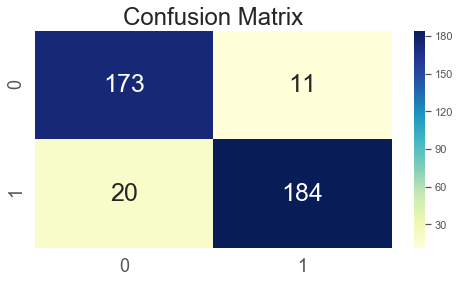

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

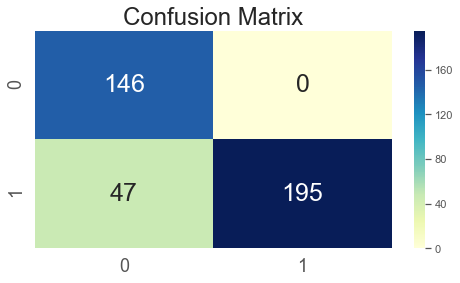

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

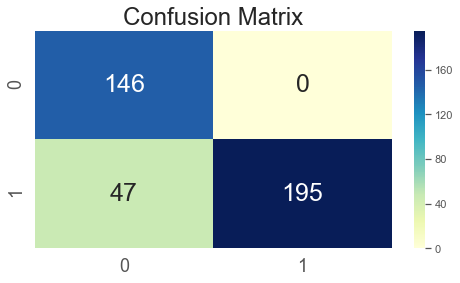

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

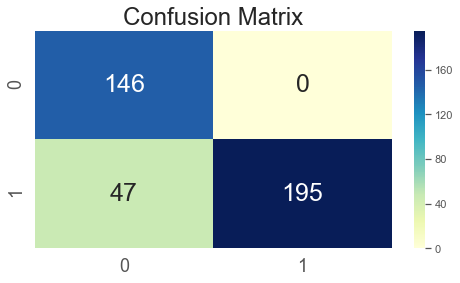

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

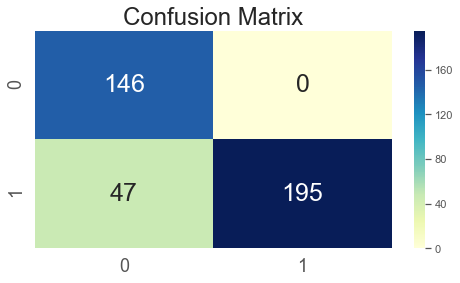

In [119]:
#Fit Cross validation model 
kernel = ['rbf']
OUT_rbf_b = fitkernelLOOCV(BIN, ytr, kernel, params)

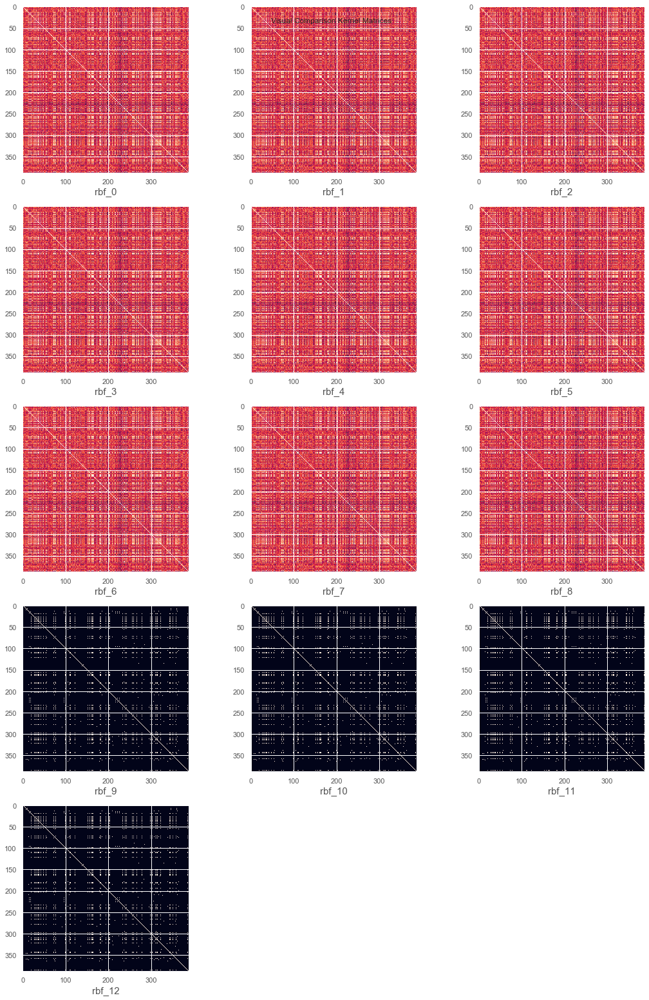

In [120]:
#Analyse performance results
PerfEva_rbf_b, KerAna_rbf_b, CVPerf_rbf_b, CVvalus_rbf_b  = Analyse_ResultsLOOCV(OUT_rbf_b)

In [121]:
#Extract performance evaluation
PerfEva_rbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
rbf_0,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_1,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_2,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_3,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_4,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_5,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_6,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_7,195,193,50.26,0.50,0.00,0.5,0.5,0.50,0.00,0.00,0.50,1.00,0.67
rbf_8,195,193,92.01,0.90,0.94,0.5,0.5,0.10,0.06,0.90,0.90,0.94,0.92
rbf_9,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90


In [122]:
PerfEva_rbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
rbf_0,0.67,50.26,0.50,0.00
rbf_1,0.67,50.26,0.50,0.00
rbf_2,0.67,50.26,0.50,0.00
rbf_3,0.67,50.26,0.50,0.00
rbf_4,0.67,50.26,0.50,0.00
rbf_5,0.67,50.26,0.50,0.00
rbf_6,0.67,50.26,0.50,0.00
rbf_7,0.67,50.26,0.50,0.00
rbf_8,0.92,92.01,0.90,0.94
rbf_9,0.90,87.89,0.81,1.00


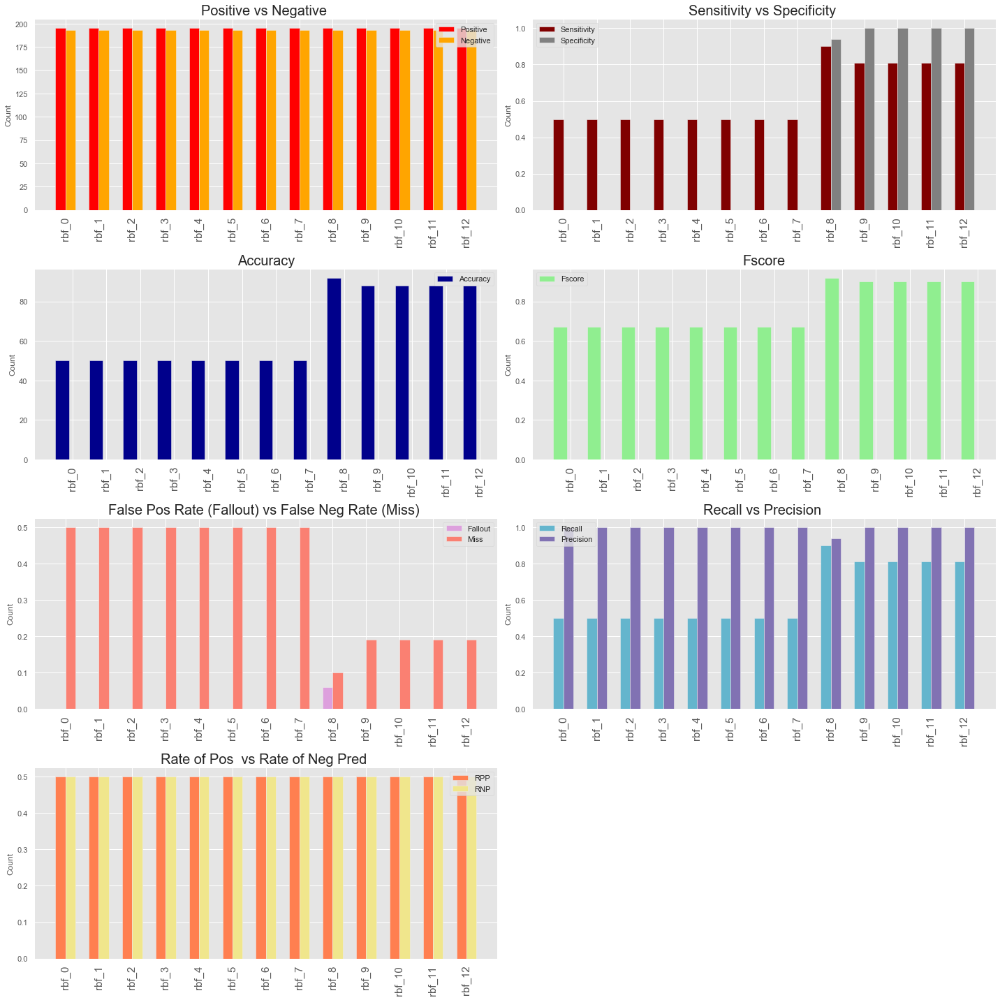

In [123]:
#visualize results
plotResult(PerfEva_rbf_b)

In [124]:
#Extract best performing parameter
id_rbf_b = PerfEva_rbf_b.reset_index().Fscore.argmax()
max_Params_rbf_b = params[kernel[0]][id_rbf_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_rbf_b.Fscore[id_rbf_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_rbf_b.Accu[id_rbf_b]}')

Best Fscore obtained with rbf kernel   - > 0.92
Best Accuracy obtained with rbf kernel - > 92.01


In [125]:
#Best result showing the specific kernel
BestRes_rbf_b = pd.DataFrame(PerfEva_rbf_b.iloc[id_rbf_b,:]).T
#index with ref to specific kernel removed. 
BestRes_rbf_b = BestRes_rbf_b.reset_index().drop(['index'], axis =1)
BestRes_rbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,92.01,0.9,0.94,0.5,0.5,0.1,0.06,0.9,0.9,0.94,0.92


In [126]:
BestRes_rbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,92.01,0.9,0.94


In [127]:
#Perf mean score and std
CVPerf_rbf_b.round(2)

,mean score,std
rbf_0,0.50,0.50
rbf_1,0.50,0.50
rbf_2,0.50,0.50
rbf_3,0.50,0.50
rbf_4,0.50,0.50
rbf_5,0.50,0.50
rbf_6,0.50,0.50
rbf_7,0.50,0.50
rbf_8,0.92,0.27
rbf_9,0.88,0.33


In [128]:
#Extract best score mean/std
Bestscore_rbf_b = pd.DataFrame(CVPerf_rbf_b.iloc[id_rbf_b,:]).T.round(2)
Bestscore_rbf_b = Bestscore_rbf_b.reset_index().drop(['index'], axis =1)
Bestscore_rbf_b

,mean score,std
0,0.92,0.27


In [129]:
#Kernel performance
KerAna_rbf_b

,train_kernel_time,diag_Dominance,is_PSD
rbf_0,2.61345,False,True
rbf_1,2.74329,False,True
rbf_2,2.57334,False,True
rbf_3,2.6305,False,True
rbf_4,2.73728,False,True
rbf_5,2.56983,False,True
rbf_6,2.54276,False,True
rbf_7,2.73377,False,True
rbf_8,2.57134,False,True
rbf_9,2.54326,False,False


In [130]:
#Extract best score mean/std
BestAnalysis_rbf_b = pd.DataFrame(KerAna_rbf_b.iloc[id_rbf_b,:]).T
BestAnalysis_rbf_b = BestAnalysis_rbf_b.reset_index().drop(['index'], axis =1)
BestAnalysis_rbf_b

,train_kernel_time,diag_Dominance,is_PSD
0,2.57134,False,True


## erbf Kernel

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

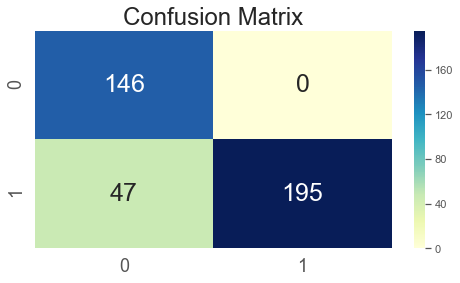

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

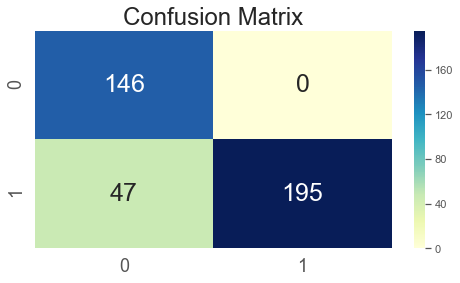

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

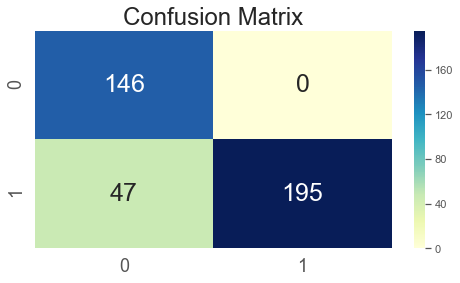

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

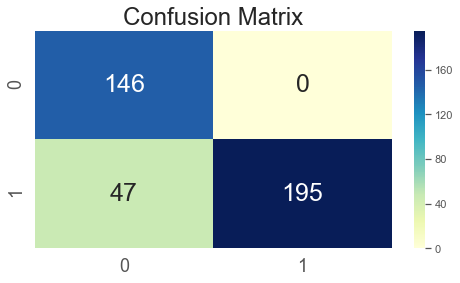

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

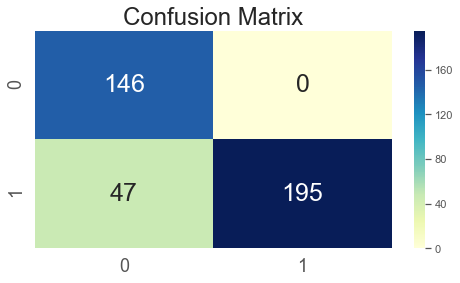

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

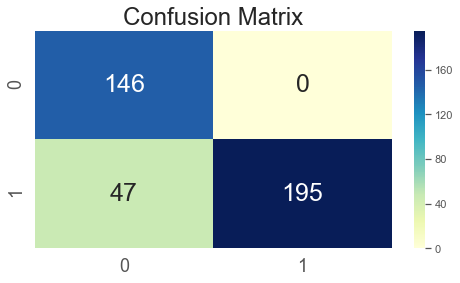

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

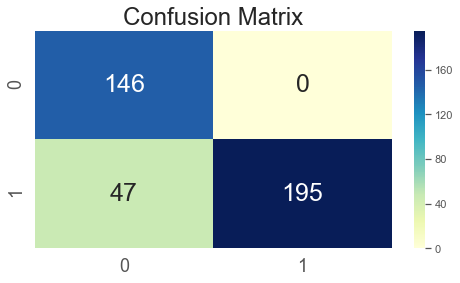

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

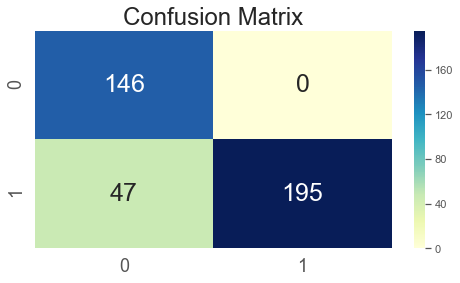

The matrix is not diagonally dominant
The matrix is diagonally dominant
--> Kernel is not PSD
--> Bag-of-Words Accuracy: 0.879 (0.326)
--> The total of 388 predicted with only 341 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  146
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  47


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 87.89 % was achieved
--> Sensitity of 0.81 was achieved
--> Specificity of 1.0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.19 false negative rate was achieved
--> 0.0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.76
--> Recall value 0f 0.81 achieved
--> The precision vaue of 1.0 achieved
--> An Fscore of 0.9 achiev

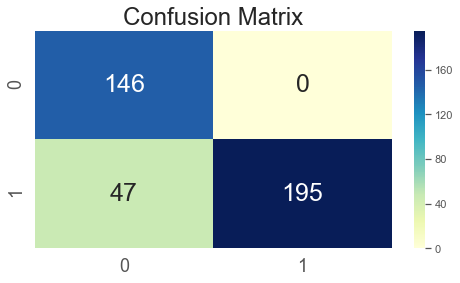

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.902 (0.297)
--> The total of 388 predicted with only 350 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  190
Actual label is False while we predicted False -  True Negatve   =  160
Actual label is False while we predicted True  -  False Positive =  5
Actual label is True while we predicted False  -  False Negative =  33


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.21 % was achieved
--> Sensitity of 0.85 was achieved
--> Specificity of 0.97 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.15 false negative rate was achieved
--> 0.03 false positve rate (fallout) was achieved
--> Negative predictive value of 0.83
--> Recall value 0f 0.85 achieved
--> The precision vaue of 0.97 achieved
--> An Fscore of 0.91 achieved


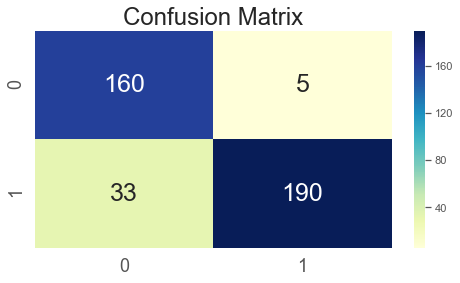

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.799 (0.401)
--> The total of 388 predicted with only 310 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  194
Actual label is False while we predicted False -  True Negatve   =  116
Actual label is False while we predicted True  -  False Positive =  1
Actual label is True while we predicted False  -  False Negative =  77


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 79.9 % was achieved
--> Sensitity of 0.72 was achieved
--> Specificity of 0.99 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.28 false negative rate was achieved
--> 0.01 false positve rate (fallout) was achieved
--> Negative predictive value of 0.6
--> Recall value 0f 0.72 achieved
--> The precision vaue of 0.99 achieved
--> An Fscore of 0.83 achieved


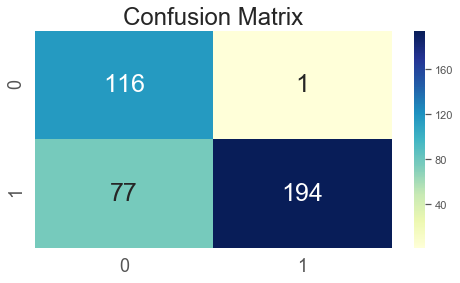

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

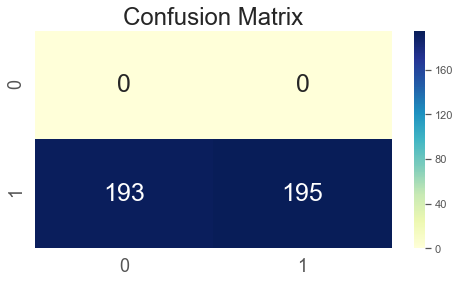

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.503 (0.500)
--> The total of 388 predicted with only 195 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  195
Actual label is False while we predicted False -  True Negatve   =  0
Actual label is False while we predicted True  -  False Positive =  0
Actual label is True while we predicted False  -  False Negative =  193

No True positives or False negatves predicted
Specificity set to 0
Fallout (false positive rate) set to 0

--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 50.26 % was achieved
--> Sensitity of 0.5 was achieved
--> Specificity of 0 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.5 false negative rate was achieved
--> 0 false positve rate (fallout) was achieved
--> Negative predictive value of 0.0
--> Recall value 0f 0.5 achiev

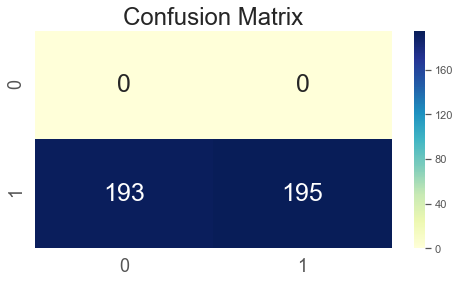

In [131]:
#Fit Cross validation model 
kernel = ['erbf']
OUT_erbf_b = fitkernelLOOCV(BIN, ytr, kernel, params)

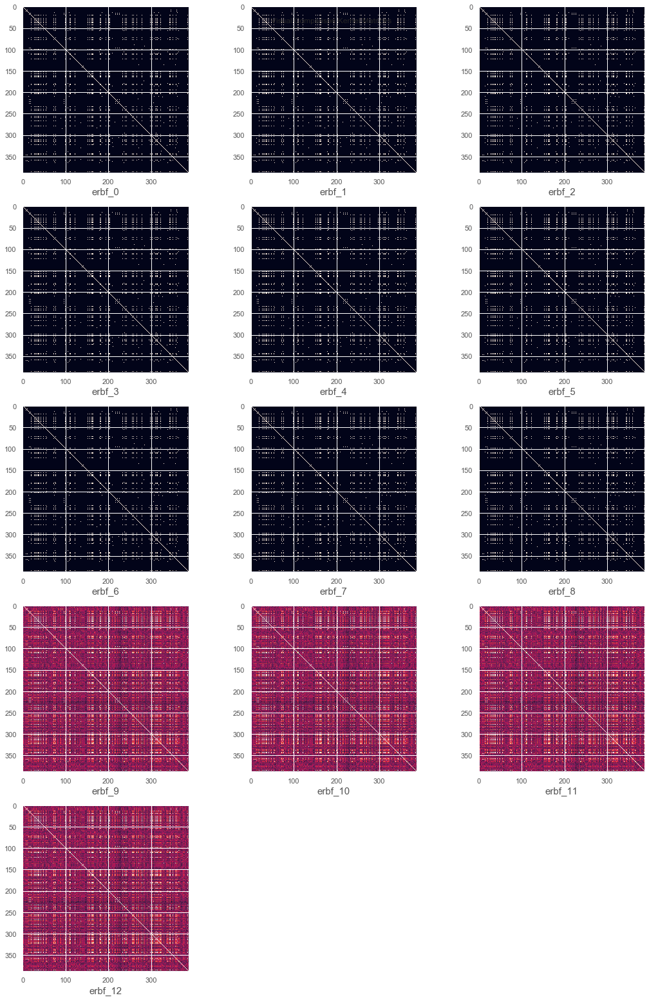

In [132]:
#Analyse performance results
PerfEva_erbf_b, KerAna_erbf_b, CVPerf_erbf_b, CVvalus_erbf_b  = Analyse_ResultsLOOCV(OUT_erbf_b)

In [133]:
#Extract performance evaluation
PerfEva_erbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
erbf_0,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_1,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_2,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_3,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_4,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_5,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_6,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_7,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_8,195,193,87.89,0.81,1.00,0.5,0.5,0.19,0.00,0.76,0.81,1.00,0.90
erbf_9,195,193,90.21,0.85,0.97,0.5,0.5,0.15,0.03,0.83,0.85,0.97,0.91


In [134]:
PerfEva_erbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
erbf_0,0.90,87.89,0.81,1.00
erbf_1,0.90,87.89,0.81,1.00
erbf_2,0.90,87.89,0.81,1.00
erbf_3,0.90,87.89,0.81,1.00
erbf_4,0.90,87.89,0.81,1.00
erbf_5,0.90,87.89,0.81,1.00
erbf_6,0.90,87.89,0.81,1.00
erbf_7,0.90,87.89,0.81,1.00
erbf_8,0.90,87.89,0.81,1.00
erbf_9,0.91,90.21,0.85,0.97


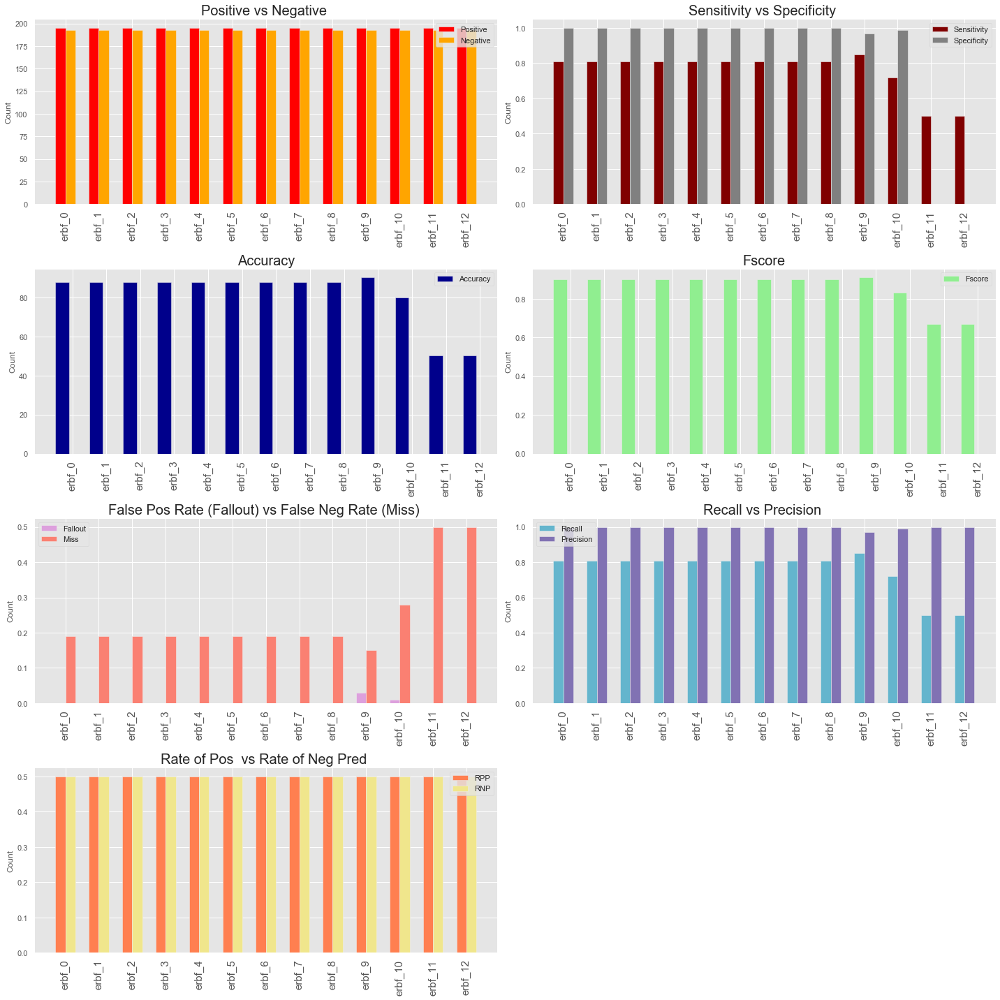

In [135]:
#visualize results
plotResult(PerfEva_erbf_b)

In [136]:
#Extract best performing parameter
id_erbf_b = PerfEva_erbf_b.reset_index().Fscore.argmax()
max_Params_erbf_b = params[kernel[0]][id_erbf_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_erbf_b.Fscore[id_erbf_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_erbf_b.Accu[id_erbf_b]}')

Best Fscore obtained with erbf kernel   - > 0.91
Best Accuracy obtained with erbf kernel - > 90.21


In [137]:
#Best result showing the specific kernel
BestRes_erbf_b = pd.DataFrame(PerfEva_erbf_b.iloc[id_erbf_b,:]).T
#index with ref to specific kernel removed. 
BestRes_erbf_b = BestRes_erbf_b.reset_index().drop(['index'], axis =1)
BestRes_erbf_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,90.21,0.85,0.97,0.5,0.5,0.15,0.03,0.83,0.85,0.97,0.91


In [138]:
BestRes_erbf_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.91,90.21,0.85,0.97


In [139]:
#Perf mean score and std
CVPerf_erbf_b.round(2)

,mean score,std
erbf_0,0.88,0.33
erbf_1,0.88,0.33
erbf_2,0.88,0.33
erbf_3,0.88,0.33
erbf_4,0.88,0.33
erbf_5,0.88,0.33
erbf_6,0.88,0.33
erbf_7,0.88,0.33
erbf_8,0.88,0.33
erbf_9,0.90,0.30


In [140]:
#Extract best score mean/std
Bestscore_erbf_b = pd.DataFrame(CVPerf_erbf_b.iloc[id_erbf_b,:]).T.round(2)
Bestscore_erbf_b = Bestscore_erbf_b.reset_index().drop(['index'], axis =1)
Bestscore_erbf_b

,mean score,std
0,0.9,0.3


In [141]:
#Kernel performance
KerAna_erbf_b

,train_kernel_time,diag_Dominance,is_PSD
erbf_0,3.0847,False,False
erbf_1,3.13834,False,False
erbf_2,3.19249,False,False
erbf_3,3.05813,False,False
erbf_4,3.24163,False,False
erbf_5,3.18747,False,False
erbf_6,3.21958,False,False
erbf_7,3.43965,False,False
erbf_8,3.65462,False,False
erbf_9,3.46471,False,True


In [142]:
#Extract best score mean/std
BestAnalysis_erbf_b = pd.DataFrame(KerAna_erbf_b.iloc[id_erbf_b,:]).T
BestAnalysis_erbf_b = BestAnalysis_erbf_b.reset_index().drop(['index'], axis =1)
BestAnalysis_erbf_b

,train_kernel_time,diag_Dominance,is_PSD
0,3.46471,False,True


## laplace Kernel

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


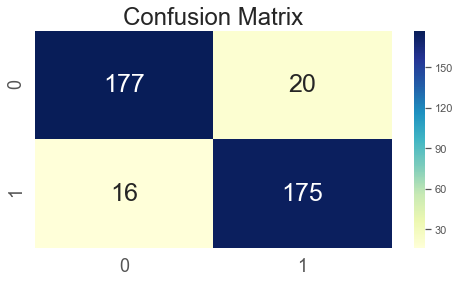

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


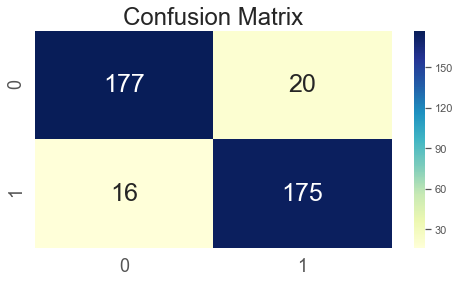

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


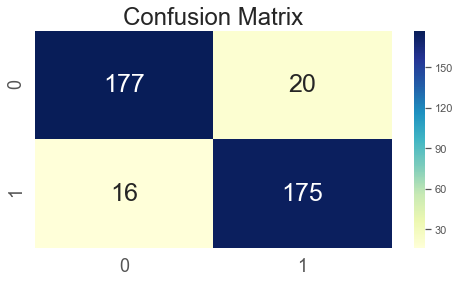

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


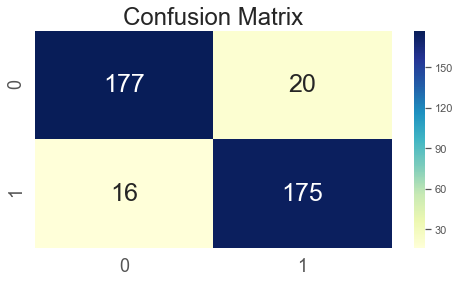

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


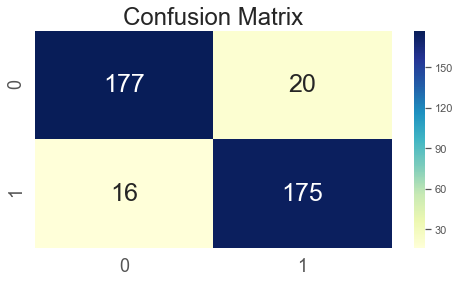

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


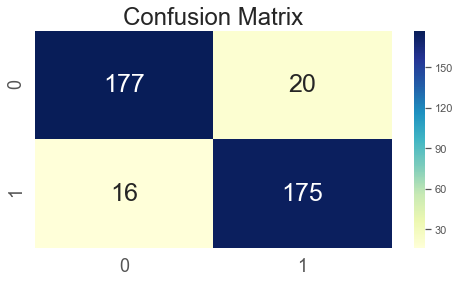

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


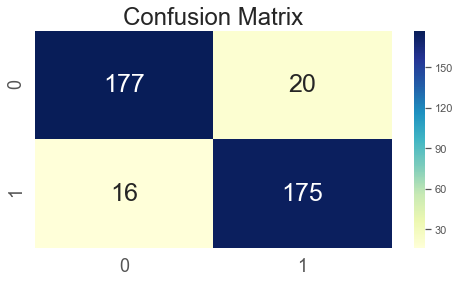

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


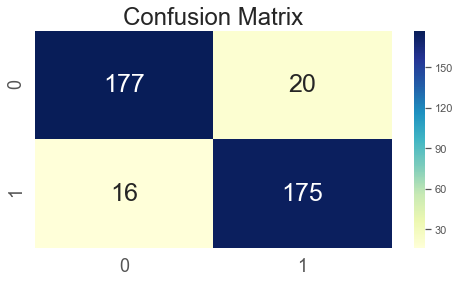

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.907 (0.290)
--> The total of 388 predicted with only 352 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  175
Actual label is False while we predicted False -  True Negatve   =  177
Actual label is False while we predicted True  -  False Positive =  20
Actual label is True while we predicted False  -  False Negative =  16


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 90.72 % was achieved
--> Sensitity of 0.92 was achieved
--> Specificity of 0.9 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.08 false negative rate was achieved
--> 0.1 false positve rate (fallout) was achieved
--> Negative predictive value of 0.92
--> Recall value 0f 0.92 achieved
--> The precision vaue of 0.9 achieved
--> An Fscore of 0.91 achieved


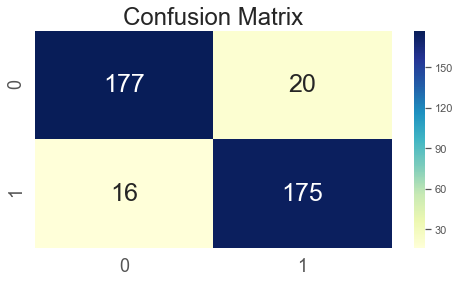

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.918 (0.275)
--> The total of 388 predicted with only 356 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  182
Actual label is False while we predicted False -  True Negatve   =  174
Actual label is False while we predicted True  -  False Positive =  13
Actual label is True while we predicted False  -  False Negative =  19


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 91.75 % was achieved
--> Sensitity of 0.91 was achieved
--> Specificity of 0.93 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.09 false negative rate was achieved
--> 0.07 false positve rate (fallout) was achieved
--> Negative predictive value of 0.9
--> Recall value 0f 0.91 achieved
--> The precision vaue of 0.93 achieved
--> An Fscore of 0.92 achieved


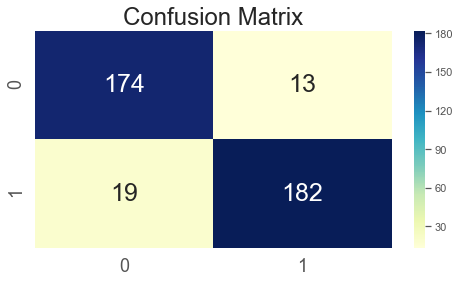

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.920 (0.271)
--> The total of 388 predicted with only 357 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  184
Actual label is False while we predicted False -  True Negatve   =  173
Actual label is False while we predicted True  -  False Positive =  11
Actual label is True while we predicted False  -  False Negative =  20


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.01 % was achieved
--> Sensitity of 0.9 was achieved
--> Specificity of 0.94 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.1 false negative rate was achieved
--> 0.06 false positve rate (fallout) was achieved
--> Negative predictive value of 0.9
--> Recall value 0f 0.9 achieved
--> The precision vaue of 0.94 achieved
--> An Fscore of 0.92 achieved


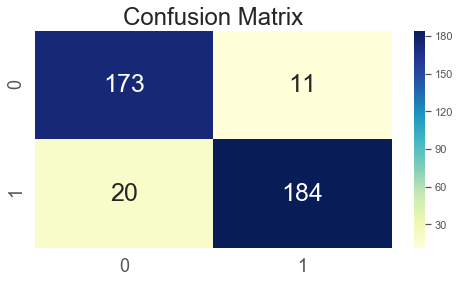

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.923 (0.267)
--> The total of 388 predicted with only 358 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  185
Actual label is False while we predicted False -  True Negatve   =  173
Actual label is False while we predicted True  -  False Positive =  10
Actual label is True while we predicted False  -  False Negative =  20


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 92.27 % was achieved
--> Sensitity of 0.9 was achieved
--> Specificity of 0.95 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.1 false negative rate was achieved
--> 0.05 false positve rate (fallout) was achieved
--> Negative predictive value of 0.9
--> Recall value 0f 0.9 achieved
--> The precision vaue of 0.95 achieved
--> An Fscore of 0.92 achieved


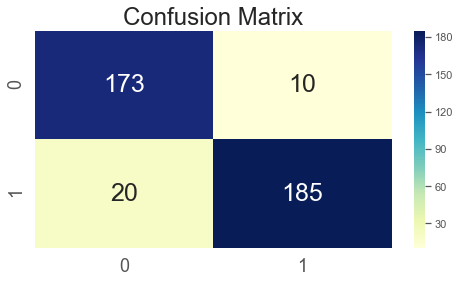

The matrix is not diagonally dominant
--> Kernel is valid and PSD
--> Bag-of-Words Accuracy: 0.897 (0.304)
--> The total of 388 predicted with only 348 accurate predictions

Ground Truth comparison

Actual label is True while we predicted True   -  True Positive  =  186
Actual label is False while we predicted False -  True Negatve   =  162
Actual label is False while we predicted True  -  False Positive =  9
Actual label is True while we predicted False  -  False Negative =  31


--> 195 positive outcomes predicted
--> 193 negative outcomes predicted
--> An accuracy of 89.69 % was achieved
--> Sensitity of 0.86 was achieved
--> Specificity of 0.95 was achieved 
--> 0.5 rate of positive prediction
--> 0.5 rate of negative prediction
--> 0.14 false negative rate was achieved
--> 0.05 false positve rate (fallout) was achieved
--> Negative predictive value of 0.84
--> Recall value 0f 0.86 achieved
--> The precision vaue of 0.95 achieved
--> An Fscore of 0.9 achieved


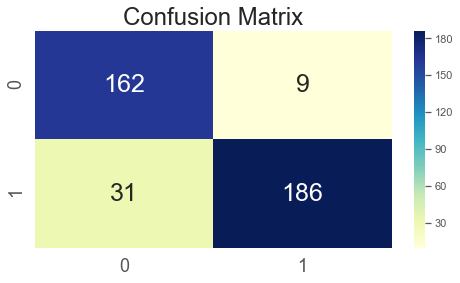

In [143]:
#Fit Cross validation model 
kernel = ['laplace']
OUT_laplace_b = fitkernelLOOCV(BIN, ytr, kernel, params)

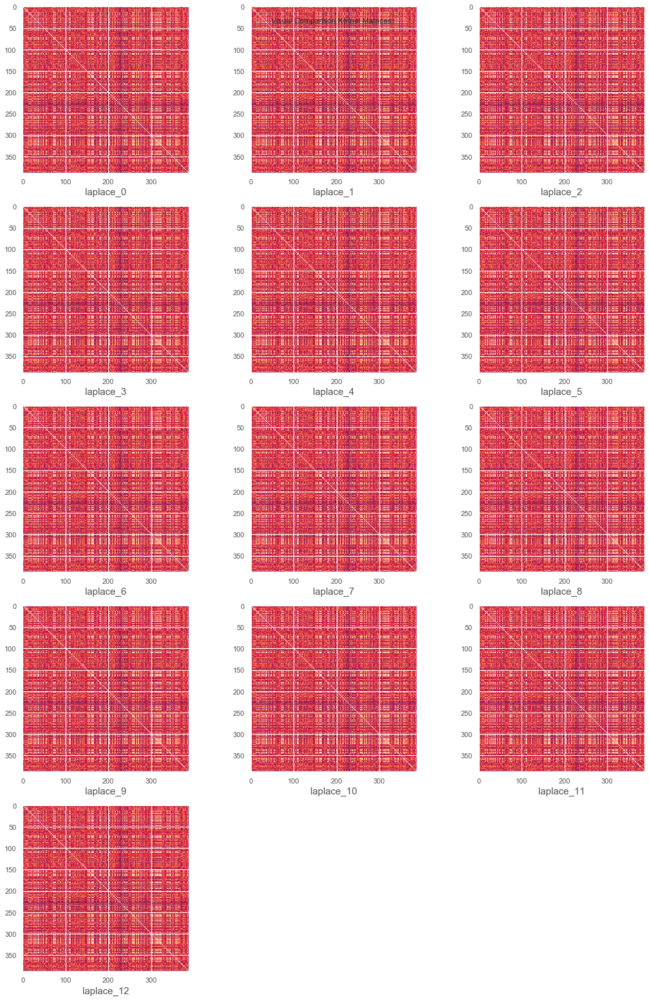

In [144]:
#Analyse performance results
PerfEva_laplace_b, KerAna_laplace_b, CVPerf_laplace_b, CVvalus_laplace_b  = Analyse_ResultsLOOCV(OUT_laplace_b)

In [145]:
#Extract performance evaluation
PerfEva_laplace_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
laplace_0,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_1,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_2,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_3,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_4,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_5,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_6,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_7,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_8,195,193,90.72,0.92,0.90,0.5,0.5,0.08,0.10,0.92,0.92,0.90,0.91
laplace_9,195,193,91.75,0.91,0.93,0.5,0.5,0.09,0.07,0.90,0.91,0.93,0.92


In [146]:
PerfEva_laplace_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
laplace_0,0.91,90.72,0.92,0.90
laplace_1,0.91,90.72,0.92,0.90
laplace_2,0.91,90.72,0.92,0.90
laplace_3,0.91,90.72,0.92,0.90
laplace_4,0.91,90.72,0.92,0.90
laplace_5,0.91,90.72,0.92,0.90
laplace_6,0.91,90.72,0.92,0.90
laplace_7,0.91,90.72,0.92,0.90
laplace_8,0.91,90.72,0.92,0.90
laplace_9,0.92,91.75,0.91,0.93


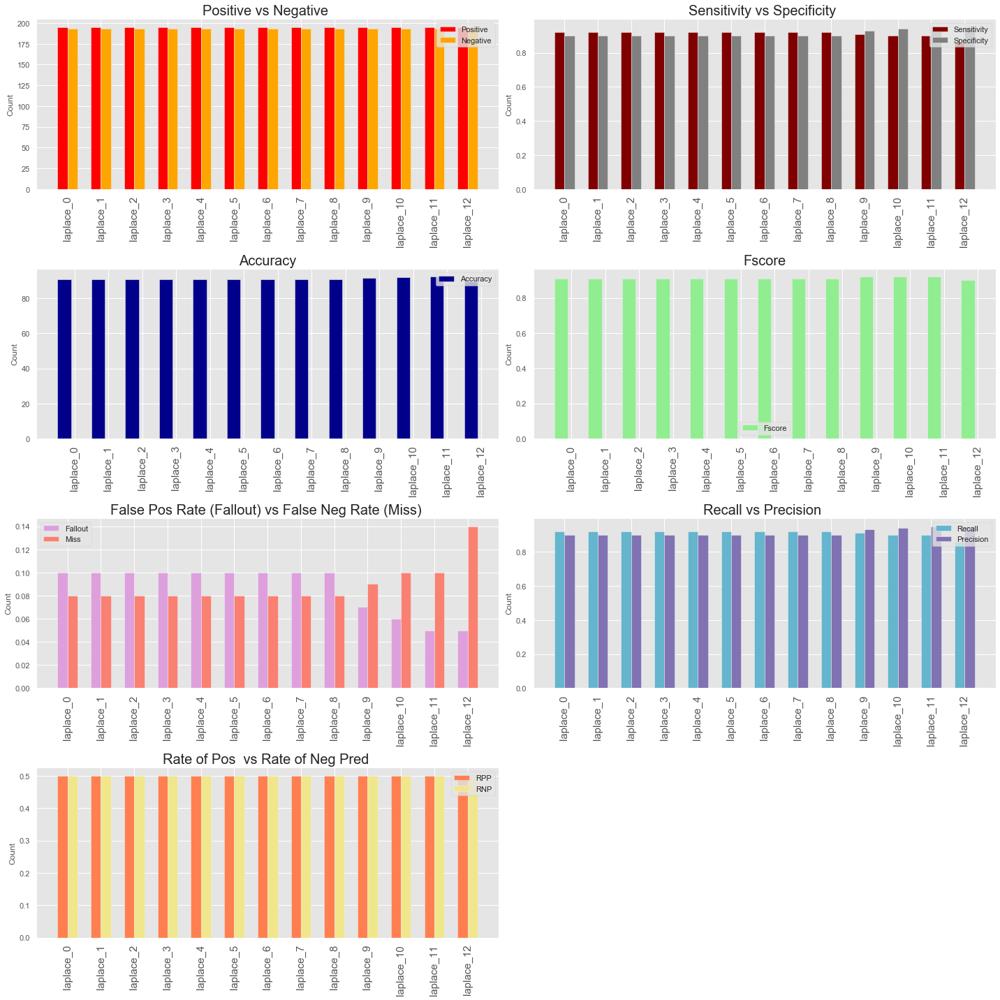

In [147]:
#visualize results
plotResult(PerfEva_laplace_b)

In [148]:
#Extract best performing parameter
id_laplace_b = PerfEva_laplace_b.reset_index().Fscore.argmax()
max_Params_laplace_b = params[kernel[0]][id_laplace_b]
print(f'Best Fscore obtained with {kernel[0]} kernel   - > {PerfEva_laplace_b.Fscore[id_laplace_b]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {PerfEva_laplace_b.Accu[id_laplace_b]}')

Best Fscore obtained with laplace kernel   - > 0.92
Best Accuracy obtained with laplace kernel - > 91.75


In [149]:
#Best result showing the specific kernel
BestRes_laplace_b = pd.DataFrame(PerfEva_laplace_b.iloc[id_laplace_b,:]).T
#index with ref to specific kernel removed. 
BestRes_laplace_b = BestRes_laplace_b.reset_index().drop(['index'], axis =1)
BestRes_laplace_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
0,195.0,193.0,91.75,0.91,0.93,0.5,0.5,0.09,0.07,0.9,0.91,0.93,0.92


In [150]:
BestRes_laplace_b[['Fscore','Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
0,0.92,91.75,0.91,0.93


In [151]:
#Perf mean score and std
CVPerf_laplace_b.round(2)

,mean score,std
laplace_0,0.91,0.29
laplace_1,0.91,0.29
laplace_2,0.91,0.29
laplace_3,0.91,0.29
laplace_4,0.91,0.29
laplace_5,0.91,0.29
laplace_6,0.91,0.29
laplace_7,0.91,0.29
laplace_8,0.91,0.29
laplace_9,0.92,0.28


In [152]:
#Extract best score mean/std
Bestscore_laplace_b = pd.DataFrame(CVPerf_laplace_b.iloc[id_laplace_b,:]).T.round(2)
Bestscore_laplace_b = Bestscore_laplace_b.reset_index().drop(['index'], axis =1)
Bestscore_laplace_b

,mean score,std
0,0.92,0.28


In [153]:
#Kernel performance
KerAna_laplace_b

,train_kernel_time,diag_Dominance,is_PSD
laplace_0,4.35811,False,True
laplace_1,4.86602,False,True
laplace_2,3.59033,False,True
laplace_3,3.36753,False,True
laplace_4,3.18375,False,True
laplace_5,4.0598,False,True
laplace_6,3.39051,False,True
laplace_7,4.45635,False,True
laplace_8,3.75047,False,True
laplace_9,3.89937,False,True


In [154]:
#Extract best score mean/std
BestAnalysis_laplace_b = pd.DataFrame(KerAna_laplace_b.iloc[id_laplace_b,:]).T
BestAnalysis_laplace_b = BestAnalysis_laplace_b.reset_index().drop(['index'], axis =1)
BestAnalysis_laplace_b

,train_kernel_time,diag_Dominance,is_PSD
0,3.89937,False,True


## Compare Results from all Kernels

In [155]:
#Combine all result dataFrames
framesAll = [BestRes_linear_b,BestRes_rbf,BestRes_erbf_b, BestRes_poly_b,BestRes_H_poly_b,BestRes_laplace_b]
All_Res_df_b = pd.concat(framesAll)
All_Res_df_b.index = ['linear_b','rbf_b','erbf_b','poly_b','H_poly_b','laplace_b']
All_Res_df_b

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear_b,195.0,193.0,91.49,0.92,0.91,0.5,0.5,0.08,0.09,0.92,0.92,0.91,0.91
rbf_b,195.0,193.0,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92
erbf_b,195.0,193.0,90.21,0.85,0.97,0.5,0.5,0.15,0.03,0.83,0.85,0.97,0.91
poly_b,195.0,193.0,92.27,0.94,0.91,0.5,0.5,0.06,0.09,0.94,0.94,0.90,0.92
H_poly_b,195.0,193.0,91.75,0.95,0.89,0.5,0.5,0.05,0.11,0.95,0.95,0.89,0.92
laplace_b,195.0,193.0,91.75,0.91,0.93,0.5,0.5,0.09,0.07,0.90,0.91,0.93,0.92


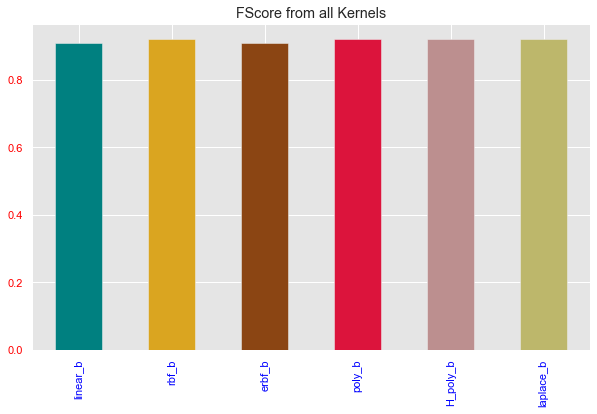

In [156]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(10, 6)

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki']
All_Res_df_b.Fscore.plot(kind='bar', color=c);
plt.title('FScore from all Kernels');

In [157]:
#Extract and print the kernel with the best F1 Score
idc   = All_Res_df_b.reset_index().Fscore.argmax()
score = All_Res_df_b.Fscore.max()
print(f'{All_Res_df_b.index[idc]} Kernel had the best F1 Score of {score}')

rbf_b Kernel had the best F1 Score of 0.92


In [158]:
#Cut down dataframe 
All_Res_df_b[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear_b,0.91,91.49,0.92,0.91
rbf_b,0.92,92.27,0.89,0.96
erbf_b,0.91,90.21,0.85,0.97
poly_b,0.92,92.27,0.94,0.91
H_poly_b,0.92,91.75,0.95,0.89
laplace_b,0.92,91.75,0.91,0.93


# Compare Binary vs Bag of Words

In [159]:
Frames_all = [All_Res_df, All_Res_df_b]

In [160]:
ViewAll = pd.concat(Frames_all)
ViewAll

,Pos,Neg,Accu,Sen,Spec,RPP,RNP,Miss,Fall,NPV,Recall,Precision,Fscore
linear,195.0,193.0,92.01,0.93,0.91,0.5,0.5,0.07,0.09,0.93,0.93,0.91,0.92
rbf,195.0,193.0,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92
erbf,195.0,193.0,90.21,0.85,0.98,0.5,0.5,0.15,0.02,0.82,0.85,0.98,0.91
poly,195.0,193.0,93.56,0.93,0.94,0.5,0.5,0.07,0.06,0.93,0.93,0.94,0.93
H_poly,195.0,193.0,92.78,0.93,0.93,0.5,0.5,0.07,0.07,0.93,0.93,0.93,0.93
laplace,195.0,193.0,95.36,0.94,0.96,0.5,0.5,0.06,0.04,0.94,0.94,0.96,0.95
linear_b,195.0,193.0,91.49,0.92,0.91,0.5,0.5,0.08,0.09,0.92,0.92,0.91,0.91
rbf_b,195.0,193.0,92.27,0.89,0.96,0.5,0.5,0.11,0.04,0.88,0.89,0.96,0.92
erbf_b,195.0,193.0,90.21,0.85,0.97,0.5,0.5,0.15,0.03,0.83,0.85,0.97,0.91
poly_b,195.0,193.0,92.27,0.94,0.91,0.5,0.5,0.06,0.09,0.94,0.94,0.90,0.92


In [161]:
#Cut down dataframe 
ViewAll[['Fscore', 'Accu','Sen','Spec']]

,Fscore,Accu,Sen,Spec
linear,0.92,92.01,0.93,0.91
rbf,0.92,92.27,0.89,0.96
erbf,0.91,90.21,0.85,0.98
poly,0.93,93.56,0.93,0.94
H_poly,0.93,92.78,0.93,0.93
laplace,0.95,95.36,0.94,0.96
linear_b,0.91,91.49,0.92,0.91
rbf_b,0.92,92.27,0.89,0.96
erbf_b,0.91,90.21,0.85,0.97
poly_b,0.92,92.27,0.94,0.91


In [162]:
#Extract best performing parameter
id_ = ViewAll.reset_index().Fscore.argmax()
max_Params= params[kernel[0]][id_]
print(f'Best Fscore obtained with {ViewAll.index[id_]} kernel   - > {ViewAll.Fscore[id_]}')
print(f'Best Accuracy obtained with {kernel[0]} kernel - > {ViewAll.Accu[id_]}')

Best Fscore obtained with laplace kernel   - > 0.95
Best Accuracy obtained with laplace kernel - > 95.36


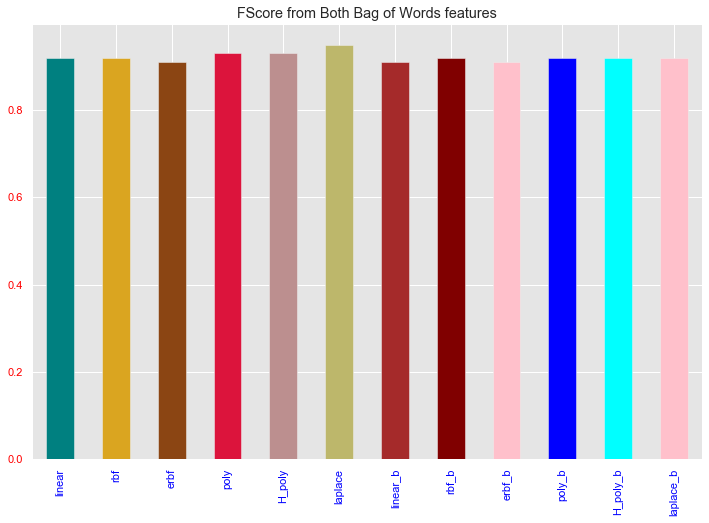

In [163]:
#Set tick colors:
#ax = plt.gca()
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)

c = ['teal', 'goldenrod', 'saddlebrown','crimson','rosybrown','darkkhaki','brown','maroon','pink','blue','aqua','pink']

ax.tick_params(axis='x', colors='blue')
ax.tick_params(axis='y', colors='red')
ViewAll.Fscore.plot(kind='bar', color=c);
plt.title('FScore from Both Bag of Words features');

## Conclusion